# Importing Libraries and Configuring values

In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from glob import glob
from PIL import Image
from tqdm import tqdm
from scipy.linalg import sqrtm
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
import warnings
warnings.filterwarnings("ignore")

# Config
IMAGE_SIZE = 128
LATENT_DIM = 100
BATCH_SIZE = 64
EPOCHS = 150
DATA_DIR = "/kaggle/input/pokemon-images-dataset/pokemon_jpg/pokemon_jpg/"
SAVE_DIR = "/kaggle/working/generated_pokemon/"
os.makedirs(SAVE_DIR, exist_ok=True)

# Loading and processing images

In [2]:
def load_images(data_dir, image_size):
    image_paths = glob(os.path.join(data_dir, "*.jpg"))
    print(f"🧾 Found {len(image_paths)} images.")
    images = []
    for path in tqdm(image_paths[:2000]):
        img = Image.open(path).convert("RGB").resize((image_size, image_size))
        img = np.asarray(img).astype(np.float32)
        img = (img - 127.5) / 127.5
        images.append(img)
    return np.array(images)

all_images = load_images(DATA_DIR, IMAGE_SIZE)

🧾 Found 819 images.


100%|██████████| 819/819 [00:07<00:00, 111.63it/s]


# Train Test Split

In [3]:
from sklearn.model_selection import train_test_split

# Split the dataset into train and test sets
train_images, test_images = train_test_split(all_images, test_size=0.2, random_state=42)

print(f"Train Images: {len(train_images)}")
print(f"Test Images:  {len(test_images)}")

Train Images: 655
Test Images:  164


# Standard Model (Default tf 2.x model)

## Generator

In [4]:
def make_generator():
    model = tf.keras.Sequential([
        layers.Dense(16 * 16 * 256, input_dim=LATENT_DIM),
        layers.Reshape((16, 16, 256)),
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(128, 4, strides=2, padding='same'),  # 32x32
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(64, 4, strides=2, padding='same'),   # 64x64
        layers.BatchNormalization(),
        layers.ReLU(),

        layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')  # 128x128
    ])
    return model

## Discriminator

In [5]:
def make_discriminator():
    model = tf.keras.Sequential([
        layers.Conv2D(64, 4, strides=2, padding='same', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
        layers.LeakyReLU(0.2),
        layers.Conv2D(128, 4, strides=2, padding='same'),
        layers.LeakyReLU(0.2),
        layers.Flatten(),
        layers.Dense(1, activation='sigmoid')
    ])
    return model

# Custome Model( Upgraded from tf 1.x to tf 2.x)

## Adding Normalzation
to help with dropout

In [6]:
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5, **kwargs):
        super().__init__(**kwargs)
        self.epsilon = epsilon

    def call(self, inputs):
        mean, var = tf.nn.moments(inputs, [1, 2], keepdims=True)
        return (inputs - mean) / tf.sqrt(var + self.epsilon)

## Generator

In [7]:
def generator():
    inputs = tf.keras.Input(shape=(LATENT_DIM,))
    x = layers.Dense(8 * 8 * 1024)(inputs)
    x = layers.Reshape((8, 8, 1024))(x)
    x = layers.LeakyReLU()(x)

    for filters in [512, 256, 128, 64]:
        x = layers.Conv2DTranspose(filters, 5, strides=2, padding='same')(x)
        x = InstanceNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = layers.Dropout(0.3)(x)

    x = layers.Conv2DTranspose(3, 5, strides=1, padding='same', activation='tanh')(x)
    return tf.keras.Model(inputs, x, name="custom_generator")

## Discriminator

In [8]:
def discriminator():
    inputs = tf.keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    x = inputs

    for filters, strides in zip([64, 128, 256, 512, 1024], [2, 2, 2, 1, 2]):
        x = layers.Conv2D(filters, 5, strides=strides, padding='same')(x)
        x = layers.LeakyReLU()(x)
        x = layers.Dropout(0.3)(x)

    x = layers.Flatten()(x)
    x = layers.Dense(1, activation='sigmoid')(x)
    return tf.keras.Model(inputs, x, name="custom_discriminator")

# Adding images inside training

In [9]:
def show_real_fake_pairs(generator, real_batch, epoch, model_name):
    noise = tf.random.normal([real_batch.shape[0], LATENT_DIM])
    fake_batch = generator(noise, training=False)

    fig, axs = plt.subplots(1, real_batch.shape[0], figsize=(real_batch.shape[0] * 2, 2))
    for i in range(real_batch.shape[0]):
        merged = np.concatenate([(real_batch[i] + 1)/2, (fake_batch[i] + 1)/2], axis=1)  # side by side
        axs[i].imshow(merged)
        axs[i].axis('off')
    plt.suptitle(f"{model_name} - Real vs Fake (Epoch {epoch})")
    plt.tight_layout()
    plt.show()

# Adding fid tracking and graphs for better understanding

In [10]:
def plot_fid_curve(fid_scores, model_name, start_epoch=10, interval=10):
    x_epochs = list(range(start_epoch, start_epoch + len(fid_scores)*interval, interval))

    plt.figure(figsize=(10, 5))
    plt.plot(x_epochs, fid_scores, marker='o')
    for i, fid in enumerate(fid_scores):
        plt.text(x_epochs[i], fid + 5, f"{fid:.1f}", ha='center', fontsize=8)
    plt.title(f"FID Over Epochs - {model_name}")
    plt.xlabel("Epoch")
    plt.ylabel("FID Score")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Traning Function( customized to work for both the models)

In [11]:
def train_dcgan(generator, discriminator, images, model_name):
    model_dir = os.path.join(SAVE_DIR, model_name)
    os.makedirs(model_dir, exist_ok=True)

    cross_entropy = tf.keras.losses.BinaryCrossentropy()
    gen_opt = tf.keras.optimizers.Adam(1e-4)
    disc_opt = tf.keras.optimizers.Adam(1e-4)
    dataset = tf.data.Dataset.from_tensor_slices(images).shuffle(1000).batch(BATCH_SIZE)

    fid_scores = []
    fixed_real_batch = images[:5]  # same 5 real samples across all epochs

    @tf.function
    def train_step(real_images):
        noise = tf.random.normal([BATCH_SIZE, LATENT_DIM])
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            fake_images = generator(noise, training=True)
            real_output = discriminator(real_images, training=True)
            fake_output = discriminator(fake_images, training=True)
            gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
            disc_loss = cross_entropy(tf.ones_like(real_output), real_output) + \
                        cross_entropy(tf.zeros_like(fake_output), fake_output)
        gen_opt.apply_gradients(zip(gen_tape.gradient(gen_loss, generator.trainable_variables), generator.trainable_variables))
        disc_opt.apply_gradients(zip(disc_tape.gradient(disc_loss, discriminator.trainable_variables), discriminator.trainable_variables))
        return gen_loss, disc_loss

    def save_generated_images(generator, epoch):
        noise = tf.random.normal([16, LATENT_DIM])
        predictions = generator(noise, training=False)
        predictions = (predictions + 1) / 2.0
        fig = plt.figure(figsize=(8, 2))
        for i in range(16):
            plt.subplot(2, 8, i + 1)
            plt.imshow(predictions[i])
            plt.axis('off')
        plt.tight_layout()
        plt.savefig(os.path.join(model_dir, f"epoch_{epoch:03d}.png"))
        plt.close()

    for epoch in range(1, EPOCHS + 1):
        for real_images in dataset:
            g_loss, d_loss = train_step(real_images)

        print(f"Epoch {epoch} - G: {g_loss:.4f} | D: {d_loss:.4f}")

        if epoch % 10 == 0:
            # Show real-fake horizontal comparison
            show_real_fake_pairs(generator, fixed_real_batch, epoch, model_name)

            # Save image grid
            save_generated_images(generator, epoch)

            # Generate fake images for FID
            fake_path = os.path.join(SAVE_DIR, f"fid_{model_name}")
            generate_fid_images(generator, fake_path, n_images=500)

            # Save real images only once
            real_path = os.path.join(SAVE_DIR, "fid_real")
            if epoch == 10 and not os.path.exists(real_path):
                os.makedirs(real_path, exist_ok=True)
                for i in range(500):
                    img = (images[i] + 1) * 127.5
                    Image.fromarray(img.astype(np.uint8)).save(f"{real_path}/{i:04d}.png")

            # FID calculation
            fid = calculate_fid(real_path, fake_path)
            fid_scores.append(fid)
            print(f"FID at Epoch {epoch}: {fid:.2f}")

    # Plot FID curve at end of training
    plot_fid_curve(fid_scores, model_name, start_epoch=10)

# Check the FID Score

> Fréchet Inception Distance (FID)

* It is used to evaluate the quality of images generated by generative models
* It measures the distance between the distributions of features extracted from real and generated images using the Inception network (a pre-trained convolutional neural network).

In [12]:
def generate_fid_images(generator, path, n_images=500):
    os.makedirs(path, exist_ok=True)
    for i in range(n_images):
        noise = tf.random.normal([1, LATENT_DIM])
        fake = generator(noise, training=False)
        fake = (fake + 1) / 2.0
        img = (fake[0].numpy() * 255).astype(np.uint8)
        Image.fromarray(img).save(os.path.join(path, f"{i:04d}.png"))

def load_fid_images(path):
    paths = glob(os.path.join(path, "*.png"))
    imgs = []
    for p in paths:
        img = Image.open(p).convert("RGB").resize((299, 299))
        imgs.append(np.asarray(img).astype(np.float32))
    return preprocess_input(np.array(imgs))

def calculate_fid(real_path, fake_path):
    model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))
    act1 = model.predict(load_fid_images(real_path), verbose=0)
    act2 = model.predict(load_fid_images(fake_path), verbose=0)
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    ssdiff = np.sum((mu1 - mu2) ** 2)
    covmean = sqrtm(sigma1 @ sigma2)
    if np.iscomplexobj(covmean): covmean = covmean.real
    return ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

# Real-vs-Fake Classifier

In [13]:
def load_classifier_data(generator, real_images, n=1000, augment_real=True, label_smoothing=True):
    # Get real images
    X_real = real_images[:n]

    # Augment real images
    if augment_real:
        X_real_aug = []
        for img in X_real:
            try:
                aug_img = tf.image.random_flip_left_right(img)
                aug_img = tf.image.random_brightness(aug_img, 0.2)
                aug_img = tf.image.random_contrast(aug_img, 0.8, 1.2)
                aug_img = tf.image.random_jpeg_quality(aug_img, 75, 100)
                aug_img = tf.clip_by_value(aug_img, -1.0, 1.0).numpy()
                X_real_aug.append(aug_img)
            except:
                continue
        X_real = np.array(X_real_aug)

    n_real = len(X_real)
    y_real = np.ones((n_real,), dtype=np.float32)
    y_fake = np.zeros((n_real,), dtype=np.float32)

    if label_smoothing:
        y_real *= 0.9
        y_fake += 0.1

    # Generate fake images with dropout + noise
    X_fake = []
    while len(X_fake) < n_real:
        noise = tf.random.normal([1, LATENT_DIM])
        img = generator(noise, training=True)[0]  # force dropout
        img = tf.image.random_brightness(img, 0.2)
        img = tf.image.random_contrast(img, 0.8, 1.2)
        img = tf.image.random_jpeg_quality(img, 75, 100)
        img = tf.clip_by_value(img, -1.0, 1.0).numpy()
        if img.shape == X_real[0].shape:
            X_fake.append(img)
    X_fake = np.array(X_fake)

    # Combine
    X = np.concatenate([X_real, X_fake])
    y = np.concatenate([y_real, y_fake])

    print(f"Final shape: X={X.shape}, y={y.shape}")
    return train_test_split(X, y, test_size=0.2, random_state=42)

def build_classifier():
    model = tf.keras.Sequential([
        layers.Conv2D(32, 3, activation='relu', input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
        layers.MaxPooling2D(),
        layers.BatchNormalization(),
        layers.Conv2D(64, 3, activation='relu'),
        layers.MaxPooling2D(),
        layers.BatchNormalization(),
        layers.Conv2D(128, 3, activation='relu'),
        layers.GlobalAveragePooling2D(),
        layers.Dropout(0.4),
        layers.Dense(64, activation='relu'),
        layers.Dense(1, activation='sigmoid')
    ])
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Training

## Standard Model

Epoch 1 - G: 1.6311 | D: 0.2392
Epoch 2 - G: 3.2389 | D: 0.0496
Epoch 3 - G: 2.9056 | D: 0.0665
Epoch 4 - G: 3.2783 | D: 0.0479
Epoch 5 - G: 3.3790 | D: 0.0922
Epoch 6 - G: 3.4528 | D: 0.0389
Epoch 7 - G: 4.1835 | D: 0.0196
Epoch 8 - G: 3.5670 | D: 0.0316
Epoch 9 - G: 4.2410 | D: 0.0157
Epoch 10 - G: 4.3447 | D: 0.0187


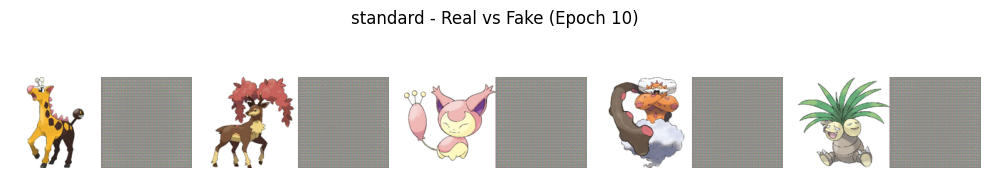

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
FID at Epoch 10: 431.98
Epoch 11 - G: 3.3489 | D: 0.0761
Epoch 12 - G: 2.7742 | D: 0.1212
Epoch 13 - G: 3.2543 | D: 0.0483
Epoch 14 - G: 3.1107 | D: 0.0918
Epoch 15 - G: 2.5816 | D: 0.1014
Epoch 16 - G: 2.9242 | D: 0.2941
Epoch 17 - G: 2.4967 | D: 0.0898
Epoch 18 - G: 3.7635 | D: 0.1390
Epoch 19 - G: 4.0472 | D: 0.1996
Epoch 20 - G: 4.8168 | D: 0.1323


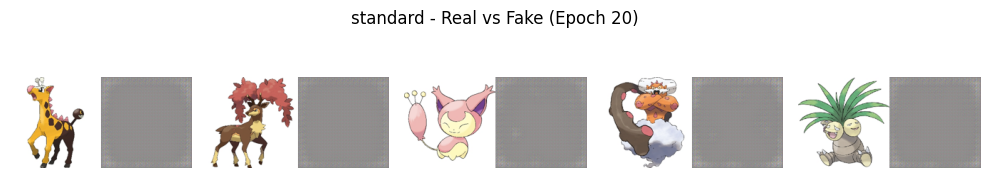

FID at Epoch 20: 519.01
Epoch 21 - G: 3.0136 | D: 0.2317
Epoch 22 - G: 2.8660 | D: 0.5999
Epoch 23 - G: 3.3720 | D: 0.2010
Epoch 24 - G: 3.7583 | D: 0.3066
Epoch 25 - G: 3.0324 | D: 0.1390
Epoch 26 - G: 2.8440 | D: 0.2304
Epoch 27 - G: 2.9344 | D: 0.0941
Epoch 28 - G: 2.6485 | D: 0.2278
Epoch 29 - G: 3.9663 | D: 0.2432
Epoch 30 - G: 4.2289 | D: 0.1243


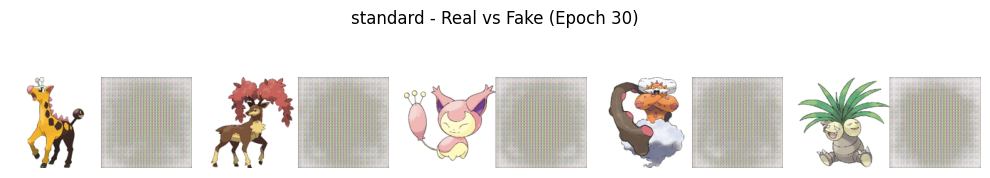

FID at Epoch 30: 398.52
Epoch 31 - G: 2.6981 | D: 0.1509
Epoch 32 - G: 2.3853 | D: 0.5126
Epoch 33 - G: 5.6457 | D: 0.3081
Epoch 34 - G: 5.6259 | D: 0.1315
Epoch 35 - G: 4.3323 | D: 0.4365
Epoch 36 - G: 4.8467 | D: 0.2941
Epoch 37 - G: 2.9346 | D: 0.2258
Epoch 38 - G: 3.2560 | D: 0.2245
Epoch 39 - G: 2.8937 | D: 0.3007
Epoch 40 - G: 3.4862 | D: 0.1610


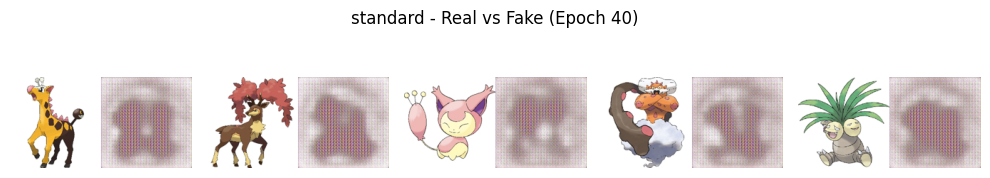

FID at Epoch 40: 374.60
Epoch 41 - G: 2.2349 | D: 1.0395
Epoch 42 - G: 1.9333 | D: 0.6914
Epoch 43 - G: 2.8185 | D: 0.5969
Epoch 44 - G: 3.4516 | D: 1.0896
Epoch 45 - G: 2.7419 | D: 1.0907
Epoch 46 - G: 3.7237 | D: 1.3240
Epoch 47 - G: 4.4971 | D: 0.4015
Epoch 48 - G: 3.9106 | D: 0.2859
Epoch 49 - G: 2.8067 | D: 0.6286
Epoch 50 - G: 3.8420 | D: 0.4321


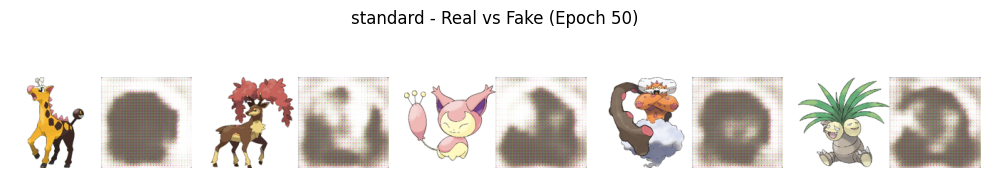

FID at Epoch 50: 394.01
Epoch 51 - G: 3.4856 | D: 0.3157
Epoch 52 - G: 2.2527 | D: 0.4357
Epoch 53 - G: 4.1451 | D: 0.1588
Epoch 54 - G: 3.1244 | D: 0.4680
Epoch 55 - G: 2.9422 | D: 0.3583
Epoch 56 - G: 3.1291 | D: 0.1804
Epoch 57 - G: 3.0710 | D: 0.4011
Epoch 58 - G: 3.0336 | D: 0.2987
Epoch 59 - G: 3.0651 | D: 0.5668
Epoch 60 - G: 2.7659 | D: 0.2689


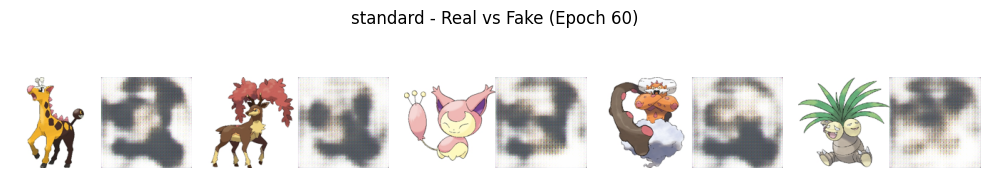

FID at Epoch 60: 408.95
Epoch 61 - G: 3.2464 | D: 0.1402
Epoch 62 - G: 2.7233 | D: 0.3300
Epoch 63 - G: 2.9695 | D: 0.2165
Epoch 64 - G: 2.5450 | D: 0.6581
Epoch 65 - G: 2.8915 | D: 0.7924
Epoch 66 - G: 2.7721 | D: 0.2966
Epoch 67 - G: 1.9742 | D: 0.7773
Epoch 68 - G: 2.2792 | D: 0.5363
Epoch 69 - G: 2.5052 | D: 0.4635
Epoch 70 - G: 3.2674 | D: 1.0497


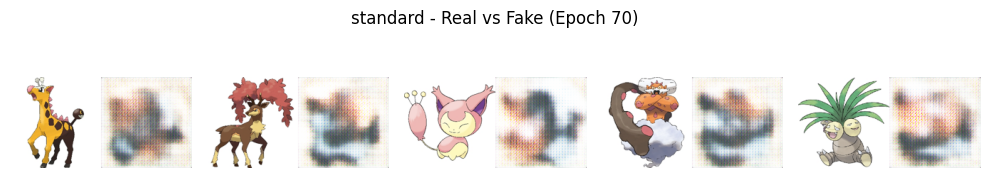

FID at Epoch 70: 408.41
Epoch 71 - G: 1.9411 | D: 0.7081
Epoch 72 - G: 2.5975 | D: 0.4604
Epoch 73 - G: 1.4731 | D: 1.0684
Epoch 74 - G: 2.4432 | D: 1.1118
Epoch 75 - G: 2.6783 | D: 1.1193
Epoch 76 - G: 2.6190 | D: 0.5268
Epoch 77 - G: 1.9535 | D: 0.7458
Epoch 78 - G: 1.6675 | D: 1.0494
Epoch 79 - G: 2.8728 | D: 0.2967
Epoch 80 - G: 3.0417 | D: 0.3315


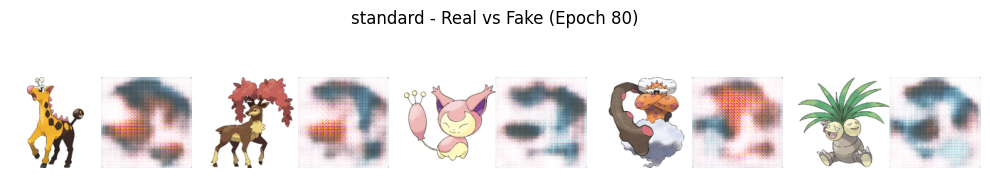

FID at Epoch 80: 339.25
Epoch 81 - G: 5.5216 | D: 0.8445
Epoch 82 - G: 2.7590 | D: 0.9788
Epoch 83 - G: 3.1230 | D: 1.3628
Epoch 84 - G: 3.9319 | D: 0.7596
Epoch 85 - G: 4.4034 | D: 1.0532
Epoch 86 - G: 3.0906 | D: 0.8733
Epoch 87 - G: 2.5182 | D: 0.9464
Epoch 88 - G: 1.9988 | D: 0.8558
Epoch 89 - G: 2.0266 | D: 0.3467
Epoch 90 - G: 2.1291 | D: 0.2230


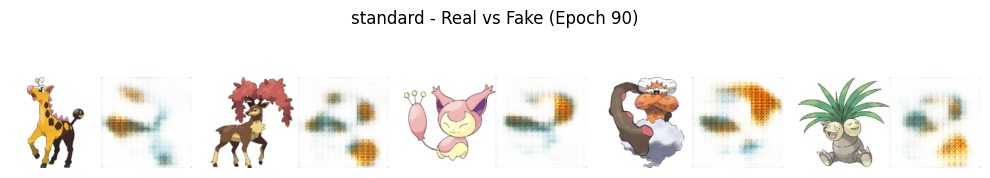

FID at Epoch 90: 293.24
Epoch 91 - G: 2.0151 | D: 0.4558
Epoch 92 - G: 2.2775 | D: 0.2764
Epoch 93 - G: 2.6895 | D: 0.4522
Epoch 94 - G: 3.2322 | D: 0.3420
Epoch 95 - G: 3.0834 | D: 1.1076
Epoch 96 - G: 1.9158 | D: 1.3368
Epoch 97 - G: 1.4659 | D: 1.0681
Epoch 98 - G: 2.4228 | D: 0.3414
Epoch 99 - G: 3.2728 | D: 0.4938
Epoch 100 - G: 2.1263 | D: 0.4069


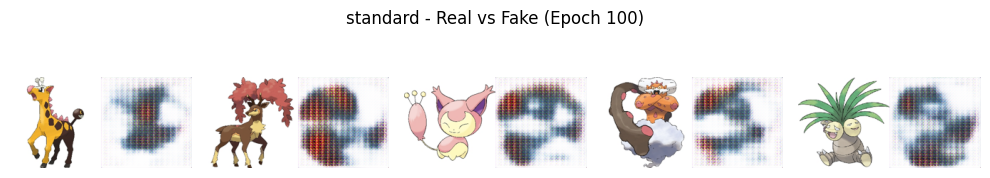

FID at Epoch 100: 388.40
Epoch 101 - G: 2.1147 | D: 0.2720
Epoch 102 - G: 2.0558 | D: 0.5923
Epoch 103 - G: 3.4832 | D: 0.4575
Epoch 104 - G: 1.8203 | D: 1.0855
Epoch 105 - G: 3.0220 | D: 0.5169
Epoch 106 - G: 3.5474 | D: 0.1208
Epoch 107 - G: 2.9917 | D: 0.3015
Epoch 108 - G: 2.6034 | D: 0.3240
Epoch 109 - G: 2.9246 | D: 0.3247
Epoch 110 - G: 2.6199 | D: 0.2741


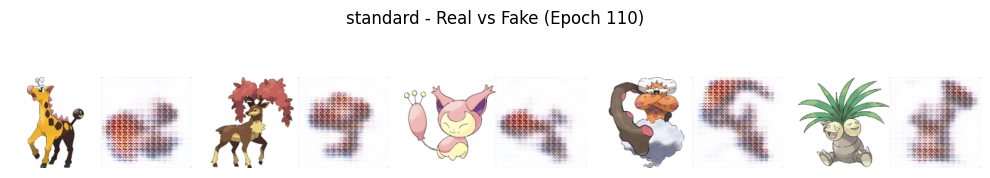

FID at Epoch 110: 303.81
Epoch 111 - G: 1.5222 | D: 0.6594
Epoch 112 - G: 2.2943 | D: 0.6724
Epoch 113 - G: 2.0362 | D: 1.2502
Epoch 114 - G: 1.6250 | D: 0.5502
Epoch 115 - G: 1.9132 | D: 0.5332
Epoch 116 - G: 2.7473 | D: 0.4087
Epoch 117 - G: 3.4088 | D: 0.2866
Epoch 118 - G: 2.2059 | D: 0.2990
Epoch 119 - G: 1.6365 | D: 0.3847
Epoch 120 - G: 3.3079 | D: 0.0704


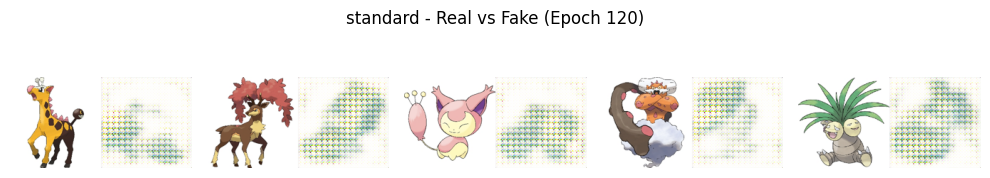

FID at Epoch 120: 386.52
Epoch 121 - G: 2.9200 | D: 0.1200
Epoch 122 - G: 2.7510 | D: 0.3223
Epoch 123 - G: 2.7177 | D: 0.2876
Epoch 124 - G: 4.0475 | D: 0.0423
Epoch 125 - G: 1.7431 | D: 0.4926
Epoch 126 - G: 1.3584 | D: 0.6671
Epoch 127 - G: 2.0704 | D: 1.2939
Epoch 128 - G: 1.8495 | D: 0.5963
Epoch 129 - G: 2.2374 | D: 0.9122
Epoch 130 - G: 1.3338 | D: 1.9581


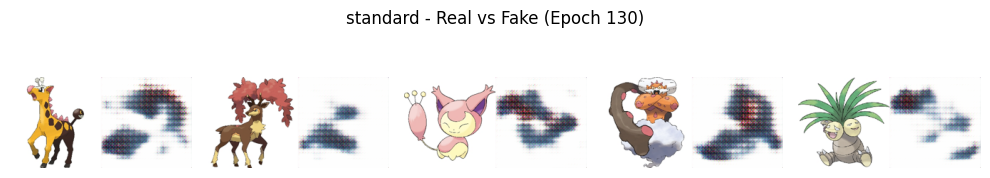

FID at Epoch 130: 320.72
Epoch 131 - G: 2.0954 | D: 1.1375
Epoch 132 - G: 2.9291 | D: 1.5757
Epoch 133 - G: 2.5246 | D: 0.4717
Epoch 134 - G: 1.7127 | D: 0.3632
Epoch 135 - G: 1.4478 | D: 0.6720
Epoch 136 - G: 1.8823 | D: 0.5271
Epoch 137 - G: 2.2520 | D: 0.7362
Epoch 138 - G: 1.8869 | D: 0.5356
Epoch 139 - G: 2.3544 | D: 0.4719
Epoch 140 - G: 3.1937 | D: 0.4221


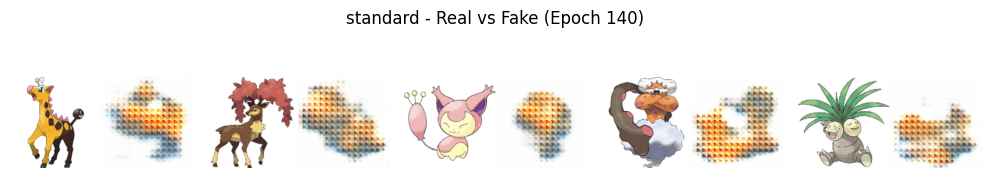

FID at Epoch 140: 350.16
Epoch 141 - G: 2.3261 | D: 0.3497
Epoch 142 - G: 1.5124 | D: 0.7312
Epoch 143 - G: 1.8316 | D: 0.5093
Epoch 144 - G: 1.7982 | D: 0.9467
Epoch 145 - G: 1.6657 | D: 0.6533
Epoch 146 - G: 1.3614 | D: 0.7976
Epoch 147 - G: 1.6434 | D: 0.5687
Epoch 148 - G: 2.0102 | D: 0.6813
Epoch 149 - G: 2.0597 | D: 0.6321
Epoch 150 - G: 2.0154 | D: 0.4814


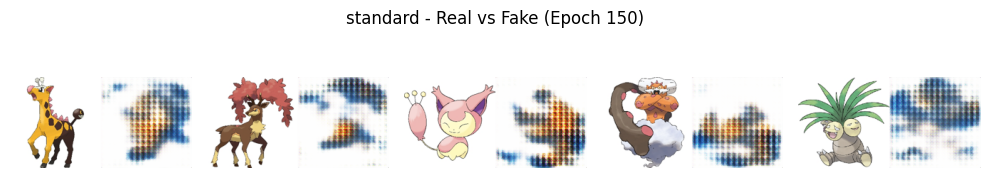

FID at Epoch 150: 310.18


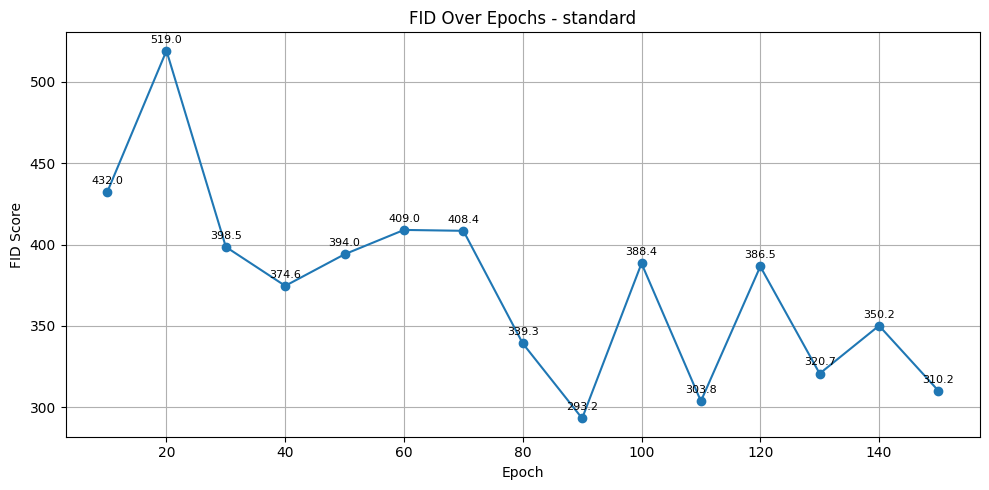

In [14]:
std_gen = make_generator()
std_disc = make_discriminator()
train_dcgan(std_gen, std_disc, train_images, "standard")

## Custom Model

Epoch 1 - G: 9.0557 | D: 0.0010
Epoch 2 - G: 16.1036 | D: 0.0000
Epoch 3 - G: 16.4283 | D: 0.0000
Epoch 4 - G: 12.4723 | D: 0.0000
Epoch 5 - G: 2.6309 | D: 0.1012
Epoch 6 - G: 10.1275 | D: 0.0001
Epoch 7 - G: 7.8411 | D: 0.0005
Epoch 8 - G: 6.8959 | D: 0.0015
Epoch 9 - G: 6.7143 | D: 0.0021
Epoch 10 - G: 20.0777 | D: 0.0013


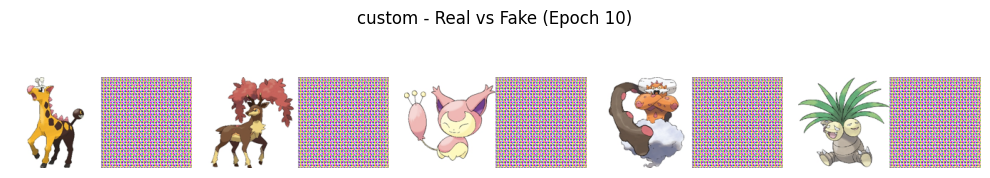

FID at Epoch 10: 433.02
Epoch 11 - G: 10.0517 | D: 0.0001
Epoch 12 - G: 24.5765 | D: 0.0061
Epoch 13 - G: 43.5986 | D: 0.2695
Epoch 14 - G: 12.3238 | D: 0.0088
Epoch 15 - G: 23.2088 | D: 0.0005
Epoch 16 - G: 15.4770 | D: 0.0064
Epoch 17 - G: 11.5309 | D: 0.0568
Epoch 18 - G: 11.2694 | D: 0.2735
Epoch 19 - G: 18.1035 | D: 0.0000
Epoch 20 - G: 12.6395 | D: 0.0034


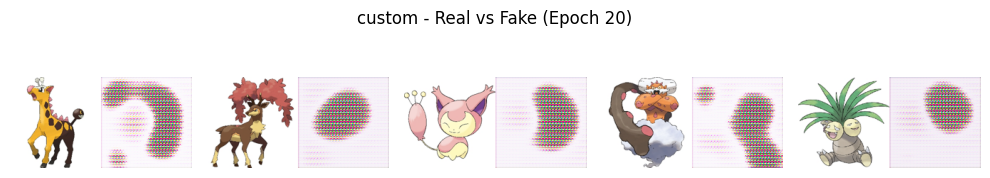

FID at Epoch 20: 342.92
Epoch 21 - G: 11.9731 | D: 0.0087
Epoch 22 - G: 18.0279 | D: 0.0036
Epoch 23 - G: 6.9538 | D: 0.0338
Epoch 24 - G: 9.8303 | D: 0.0091
Epoch 25 - G: 5.6695 | D: 0.0301
Epoch 26 - G: 6.9745 | D: 0.0075
Epoch 27 - G: 8.5245 | D: 0.0056
Epoch 28 - G: 6.0245 | D: 0.0336
Epoch 29 - G: 9.3978 | D: 0.0111
Epoch 30 - G: 7.4102 | D: 0.0078


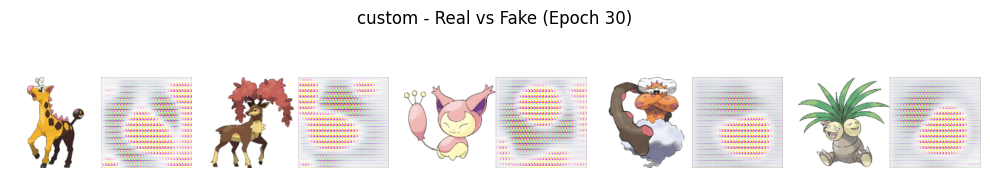

FID at Epoch 30: 340.20
Epoch 31 - G: 18.6640 | D: 0.0012
Epoch 32 - G: 15.1918 | D: 0.0645
Epoch 33 - G: 4.3130 | D: 0.1246
Epoch 34 - G: 19.2848 | D: 3.2809
Epoch 35 - G: 3.9456 | D: 0.2246
Epoch 36 - G: 23.8245 | D: 2.1099
Epoch 37 - G: 25.9910 | D: 0.0376
Epoch 38 - G: 10.0500 | D: 0.0151
Epoch 39 - G: 2.7438 | D: 0.6576
Epoch 40 - G: 2.3960 | D: 0.5273


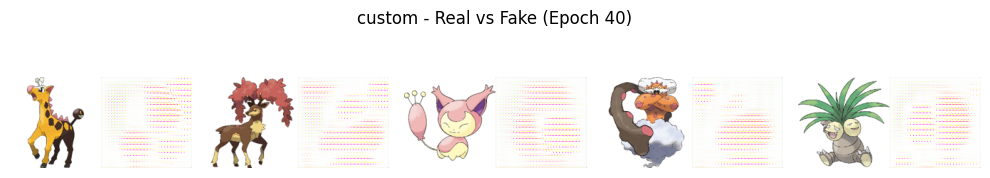

FID at Epoch 40: 337.01
Epoch 41 - G: 4.9811 | D: 0.1113
Epoch 42 - G: 3.8229 | D: 0.0592
Epoch 43 - G: 7.0183 | D: 0.0035
Epoch 44 - G: 6.6605 | D: 0.1498
Epoch 45 - G: 3.5582 | D: 0.4677
Epoch 46 - G: 5.0848 | D: 0.2133
Epoch 47 - G: 8.1875 | D: 0.0014
Epoch 48 - G: 3.3582 | D: 0.5234
Epoch 49 - G: 4.3268 | D: 0.1418
Epoch 50 - G: 22.6033 | D: 0.0235


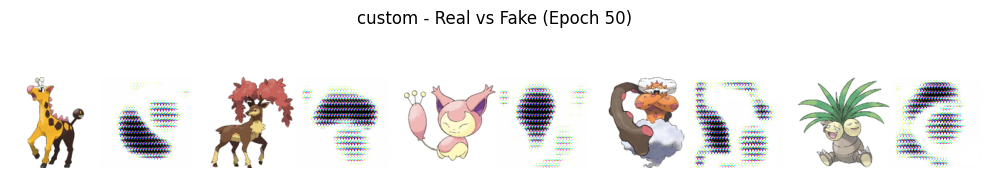

FID at Epoch 50: 309.76
Epoch 51 - G: 10.6900 | D: 0.1582
Epoch 52 - G: 27.9063 | D: 0.0019
Epoch 53 - G: 12.2157 | D: 0.6328
Epoch 54 - G: 4.3767 | D: 0.1762
Epoch 55 - G: 11.4196 | D: 0.0025
Epoch 56 - G: 19.8677 | D: 0.0058
Epoch 57 - G: 12.0653 | D: 0.1055
Epoch 58 - G: 7.2912 | D: 0.0300
Epoch 59 - G: 19.7825 | D: 0.0762
Epoch 60 - G: 16.0182 | D: 0.0121


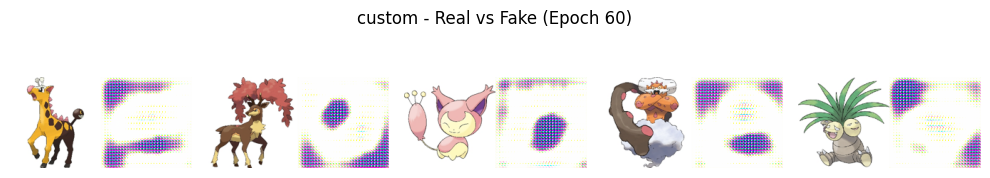

FID at Epoch 60: 399.46
Epoch 61 - G: 15.0341 | D: 0.0026
Epoch 62 - G: 9.7335 | D: 0.0476
Epoch 63 - G: 7.8202 | D: 0.0460
Epoch 64 - G: 9.3963 | D: 0.0305
Epoch 65 - G: 18.7680 | D: 0.0010
Epoch 66 - G: 6.7085 | D: 0.1019
Epoch 67 - G: 7.7404 | D: 0.0211
Epoch 68 - G: 10.2076 | D: 0.0156
Epoch 69 - G: 16.1544 | D: 0.0029
Epoch 70 - G: 7.3073 | D: 0.1344


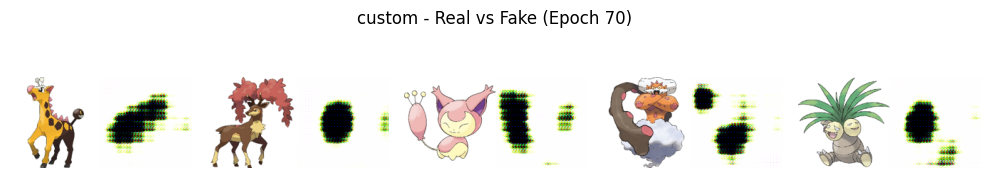

FID at Epoch 70: 301.96
Epoch 71 - G: 4.2106 | D: 0.3606
Epoch 72 - G: 5.2129 | D: 0.0985
Epoch 73 - G: 5.4777 | D: 0.1384
Epoch 74 - G: 10.5196 | D: 0.1408
Epoch 75 - G: 6.8880 | D: 0.3201
Epoch 76 - G: 3.6338 | D: 0.1289
Epoch 77 - G: 5.1290 | D: 0.0338
Epoch 78 - G: 4.9114 | D: 0.0410
Epoch 79 - G: 5.2048 | D: 0.0288
Epoch 80 - G: 7.6542 | D: 0.0081


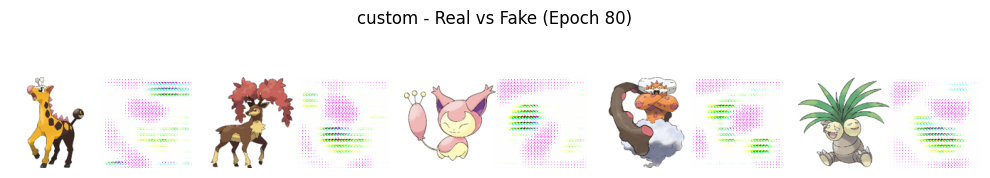

FID at Epoch 80: 347.49
Epoch 81 - G: 7.3932 | D: 0.0037
Epoch 82 - G: 4.6531 | D: 0.0344
Epoch 83 - G: 4.6160 | D: 0.1933
Epoch 84 - G: 12.3069 | D: 0.0045
Epoch 85 - G: 7.2687 | D: 0.0080
Epoch 86 - G: 5.2370 | D: 0.0200
Epoch 87 - G: 4.5344 | D: 0.0356
Epoch 88 - G: 5.5786 | D: 0.0251
Epoch 89 - G: 5.5677 | D: 0.0101
Epoch 90 - G: 6.0647 | D: 0.0585


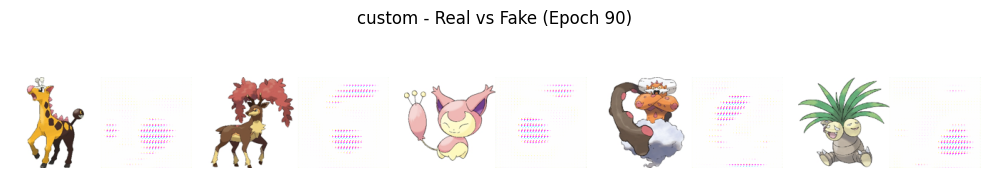

FID at Epoch 90: 357.83
Epoch 91 - G: 4.6294 | D: 0.0218
Epoch 92 - G: 5.5349 | D: 0.0431
Epoch 93 - G: 10.2131 | D: 0.0184
Epoch 94 - G: 4.9844 | D: 0.0202
Epoch 95 - G: 6.9110 | D: 0.0087
Epoch 96 - G: 7.5169 | D: 0.0068
Epoch 97 - G: 5.1151 | D: 0.4302
Epoch 98 - G: 16.1139 | D: 0.5331
Epoch 99 - G: 6.3454 | D: 0.0091
Epoch 100 - G: 4.8119 | D: 0.0420


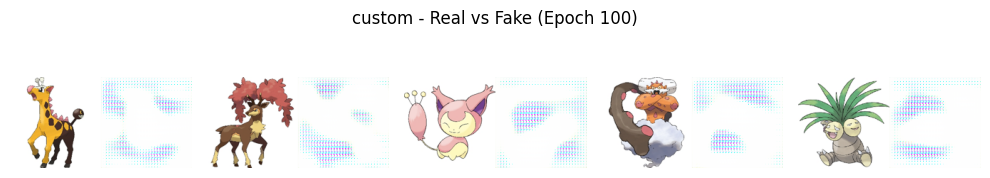

FID at Epoch 100: 490.18
Epoch 101 - G: 7.2821 | D: 0.0028
Epoch 102 - G: 6.3348 | D: 0.0061
Epoch 103 - G: 4.4318 | D: 0.1052
Epoch 104 - G: 9.7829 | D: 0.0003
Epoch 105 - G: 8.1714 | D: 0.0027
Epoch 106 - G: 6.1400 | D: 0.1675
Epoch 107 - G: 18.3522 | D: 0.0001
Epoch 108 - G: 8.6850 | D: 0.6504
Epoch 109 - G: 6.3618 | D: 0.2826
Epoch 110 - G: 8.1456 | D: 0.1059


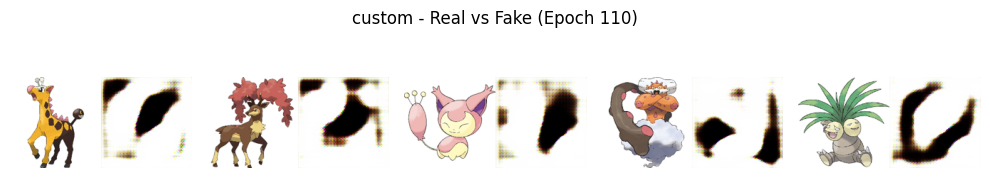

FID at Epoch 110: 434.03
Epoch 111 - G: 12.6107 | D: 0.0132
Epoch 112 - G: 7.4268 | D: 0.0649
Epoch 113 - G: 9.2862 | D: 0.0823
Epoch 114 - G: 9.2566 | D: 0.1382
Epoch 115 - G: 11.5993 | D: 0.6898
Epoch 116 - G: 6.7570 | D: 0.0311
Epoch 117 - G: 12.5945 | D: 0.1773
Epoch 118 - G: 9.0728 | D: 0.0100
Epoch 119 - G: 9.4321 | D: 0.1469
Epoch 120 - G: 4.0613 | D: 0.0709


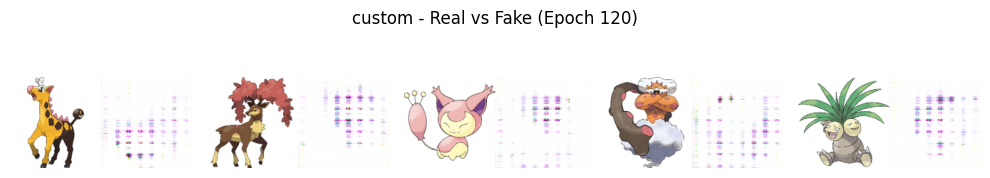

FID at Epoch 120: 366.27
Epoch 121 - G: 6.8065 | D: 0.0022
Epoch 122 - G: 5.6305 | D: 0.0295
Epoch 123 - G: 6.1278 | D: 0.0485
Epoch 124 - G: 8.0675 | D: 0.0367
Epoch 125 - G: 6.7974 | D: 0.0031
Epoch 126 - G: 7.2239 | D: 0.0453
Epoch 127 - G: 7.3210 | D: 0.0018
Epoch 128 - G: 6.8735 | D: 0.0023
Epoch 129 - G: 8.5436 | D: 0.0007
Epoch 130 - G: 7.6016 | D: 0.0319


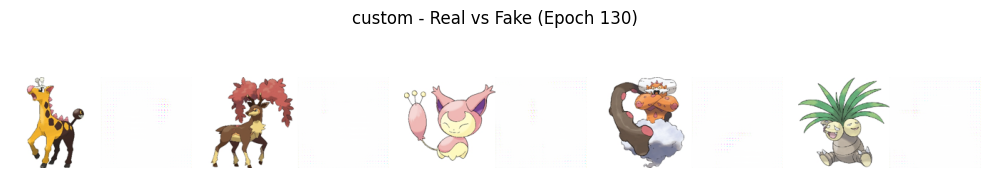

FID at Epoch 130: 348.88
Epoch 131 - G: 13.3647 | D: 0.8988
Epoch 132 - G: 7.0869 | D: 0.0063
Epoch 133 - G: 6.7471 | D: 0.0225
Epoch 134 - G: 8.5526 | D: 0.0011
Epoch 135 - G: 11.3090 | D: 0.0002
Epoch 136 - G: 5.7985 | D: 0.0280
Epoch 137 - G: 10.7653 | D: 0.1641
Epoch 138 - G: 8.8057 | D: 0.0006
Epoch 139 - G: 7.6761 | D: 0.1541
Epoch 140 - G: 8.6757 | D: 0.0017


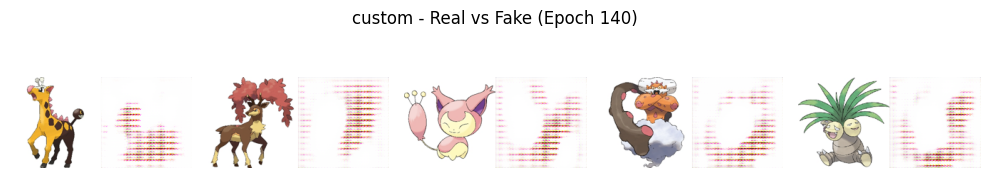

FID at Epoch 140: 322.17
Epoch 141 - G: 8.6840 | D: 0.0159
Epoch 142 - G: 6.5974 | D: 0.0108
Epoch 143 - G: 9.7926 | D: 0.0136
Epoch 144 - G: 8.1872 | D: 0.0194
Epoch 145 - G: 6.2675 | D: 0.0519
Epoch 146 - G: 14.5546 | D: 0.0005
Epoch 147 - G: 9.3145 | D: 0.0088
Epoch 148 - G: 5.5932 | D: 0.0473
Epoch 149 - G: 4.6461 | D: 0.0392
Epoch 150 - G: 5.8224 | D: 0.0078


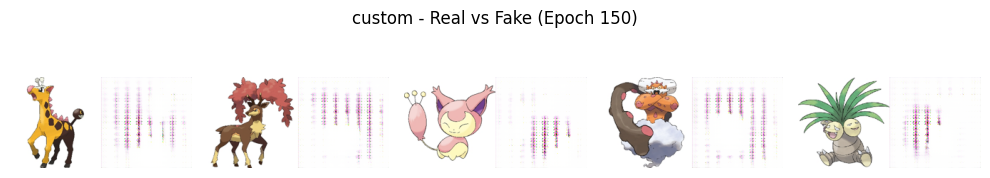

FID at Epoch 150: 327.22


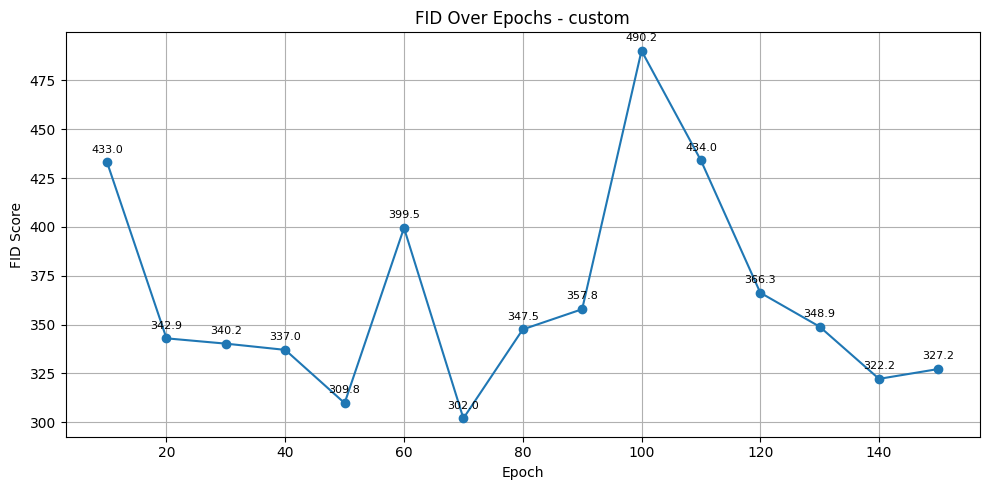

In [15]:
cus_gen = generator()
cus_disc = discriminator()
train_dcgan(cus_gen, cus_disc, train_images, "custom")

# Smoothed accuracy function

In [16]:
def smoothed_accuracy(y_true, y_pred):
    y_true = (y_true > 0.5).astype(int)
    y_pred = (y_pred > 0.5).astype(int)
    return np.mean(y_true == y_pred)

# GAN Evaluation (FID on train + test) - Before Hyperparameter Tuning

In [17]:
# Save real train/test images
REAL_TRAIN = os.path.join(SAVE_DIR, "fid_real_train")
REAL_TEST = os.path.join(SAVE_DIR, "fid_real_test")
os.makedirs(REAL_TRAIN, exist_ok=True)
os.makedirs(REAL_TEST, exist_ok=True)

num_samples = min(500, len(train_images), len(test_images))
for i in range(num_samples):
    train_img = (train_images[i] + 1) * 127.5
    test_img = (test_images[i] + 1) * 127.5
    Image.fromarray(train_img.astype(np.uint8)).save(f"{REAL_TRAIN}/{i:04d}.png")
    Image.fromarray(test_img.astype(np.uint8)).save(f"{REAL_TEST}/{i:04d}.png")

# Save fake images from both generators
FAKE_STD_TRAIN = os.path.join(SAVE_DIR, "fake_std_train")
FAKE_STD_TEST = os.path.join(SAVE_DIR, "fake_std_test")
generate_fid_images(std_gen, FAKE_STD_TRAIN)
generate_fid_images(std_gen, FAKE_STD_TEST)

FAKE_CUS_TRAIN = os.path.join(SAVE_DIR, "fake_cus_train")
FAKE_CUS_TEST = os.path.join(SAVE_DIR, "fake_cus_test")
generate_fid_images(cus_gen, FAKE_CUS_TRAIN)
generate_fid_images(cus_gen, FAKE_CUS_TEST)

# Calculate FID scores
fid_std_train = calculate_fid(REAL_TRAIN, FAKE_STD_TRAIN)
fid_std_test = calculate_fid(REAL_TEST, FAKE_STD_TEST)
fid_cus_train = calculate_fid(REAL_TRAIN, FAKE_CUS_TRAIN)
fid_cus_test = calculate_fid(REAL_TEST, FAKE_CUS_TEST)

# ----------- Real-vs-Fake Classifier Accuracy --------------

# For standard GAN
Xtr_std, Xte_std, ytr_std, yte_std = load_classifier_data(std_gen, train_images)
clf_std = build_classifier()
clf_std.fit(Xtr_std, ytr_std, epochs=5, batch_size=64, verbose=0)
# acc_std_train = clf_std.evaluate(Xtr_std, ytr_std, verbose=0)[1]
# acc_std_test = clf_std.evaluate(Xte_std, yte_std, verbose=0)[1]
acc_std_train = smoothed_accuracy(ytr_std, clf_std.predict(Xtr_std).ravel())
acc_std_test  = smoothed_accuracy(yte_std, clf_std.predict(Xte_std).ravel())

# Check label distribution
unique, counts = np.unique(np.concatenate([ytr_std, yte_std]), return_counts=True)
print("Standard GAN Labels:", dict(zip(unique, counts)))


# For custom GAN
Xtr_cus, Xte_cus, ytr_cus, yte_cus = load_classifier_data(cus_gen, train_images)
clf_cus = build_classifier()
clf_cus.fit(Xtr_cus, ytr_cus, epochs=5, batch_size=64, verbose=0)
# acc_cus_train = clf_cus.evaluate(Xtr_cus, ytr_cus, verbose=0)[1]
# acc_cus_test = clf_cus.evaluate(Xte_cus, yte_cus, verbose=0)[1]
acc_cus_train = smoothed_accuracy(ytr_cus, clf_cus.predict(Xtr_cus).ravel())
acc_cus_test  = smoothed_accuracy(yte_cus, clf_cus.predict(Xte_cus).ravel())

# Check label distribution
unique, counts = np.unique(np.concatenate([ytr_cus, yte_cus]), return_counts=True)
print("Custom GAN Labels:", dict(zip(unique, counts)))

# Check classifier predictions
print("Standard Classifier - sample predictions:")
print(clf_std.predict(Xte_std[:10]).ravel(),end="\n\n")

print("Custom Classifier - sample predictions:")
print(clf_cus.predict(Xte_cus[:10]).ravel(),end="\n\n")

# --------------- Print Final Evaluation Summary ----------------

print("\nEvaluation BEFORE Hyperparameter Tuning\n")
print("Standard DCGAN")
print(f"   FID (Train): {fid_std_train:.2f} | FID (Test): {fid_std_test:.2f}")
print(f"   Classifier Accuracy (Train): {acc_std_train:.2%} | (Test): {acc_std_test:.2%}")

print("\nCustom DCGAN")
print(f"   FID (Train): {fid_cus_train:.2f} | FID (Test): {fid_cus_test:.2f}")
print(f"   Classifier Accuracy (Train): {acc_cus_train:.2%} | (Test): {acc_cus_test:.2%}")

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Standard GAN Labels: {0.1: 655, 0.9: 655}
Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Custom GAN Labels: {0.1: 655, 0.9: 655}
Standard Classifier - sample predictions:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step
[0.4423411  0.43355286 0.44784573 0.43020695 0.49520546 0.4230705
 0.4299813  0.44035769 0.43018025 0.5052158 ]

Custom Classifier - sample predictions:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
[0.25998512 0.2711393  0.3211229  0.2705972  0.30138344 0.27039924
 0.27107182 0.27074897 0.27123043 0.31399602]


Evaluation BEFORE Hyperparameter Tuning

Standard DCGAN
   FID (Train): 319.81 | FID (Test): 324.78
   Classifier Accuracy (Train): 57.82% | (Test): 56.11%

Custom DCGAN
   FID (Train): 334.38 | FID (Test): 340.72
   Classifier Accuracy (Train): 50.38% | (Test): 48.47%


In [18]:
print("Classifier Accuracy (w/ Label Smoothing)")
print(f"Standard DCGAN → Train: {acc_std_train:.2%}, Test: {acc_std_test:.2%}")
print(f"Custom DCGAN   → Train: {acc_cus_train:.2%}, Test: {acc_cus_test:.2%}")

Classifier Accuracy (w/ Label Smoothing)
Standard DCGAN → Train: 57.82%, Test: 56.11%
Custom DCGAN   → Train: 50.38%, Test: 48.47%


# Hyperparameter Tuning

The models are finetuned by using these as the parameter and options.
1. learning rate - 0.0001 and 0.0002
2. Dropouts - 20% and 30%
3. Batch sizes - 64,128

## Custom DCGAN Tuning

Starting Hyperparameter Tuning for Custom DCGAN...

Custom GAN Combo: LR=0.0001, Dropout=0.2, Batch=64
Epoch 1 - G: 5.3788 | D: 0.0048
Epoch 2 - G: 27.1936 | D: 0.0000
Epoch 3 - G: 26.8774 | D: 0.0000
Epoch 4 - G: 3.9564 | D: 0.0224
Epoch 5 - G: 6.1701 | D: 0.0026
Epoch 6 - G: 5.7882 | D: 0.0046
Epoch 7 - G: 10.9831 | D: 0.0309
Epoch 8 - G: 5.0249 | D: 0.3724
Epoch 9 - G: 6.6433 | D: 0.0114
Epoch 10 - G: 4.0740 | D: 0.0293


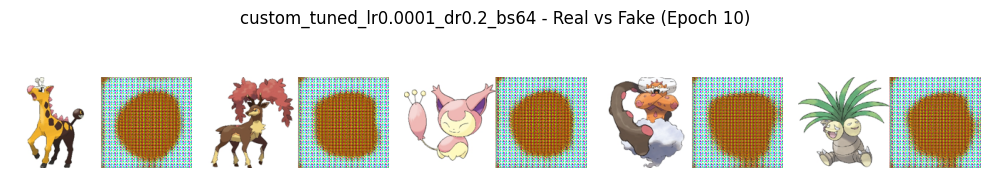

FID at Epoch 10: 502.72
Epoch 11 - G: 5.6337 | D: 0.0479
Epoch 12 - G: 18.3531 | D: 0.0000
Epoch 13 - G: 31.6840 | D: 0.0003
Epoch 14 - G: 16.2564 | D: 0.1012
Epoch 15 - G: 12.6941 | D: 0.1572
Epoch 16 - G: 9.0130 | D: 0.0430
Epoch 17 - G: 10.5814 | D: 0.0026
Epoch 18 - G: 5.6836 | D: 0.0152
Epoch 19 - G: 7.8453 | D: 0.0136
Epoch 20 - G: 6.7129 | D: 0.0064


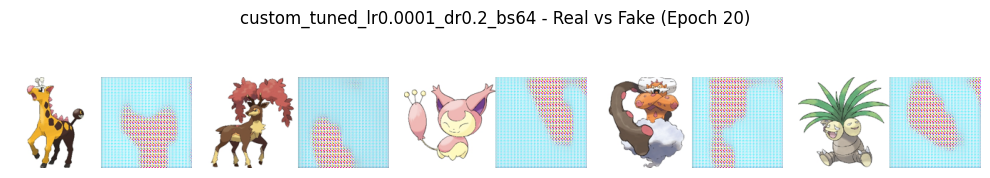

FID at Epoch 20: 395.20
Epoch 21 - G: 2.4447 | D: 0.5754
Epoch 22 - G: 19.1787 | D: 0.0001
Epoch 23 - G: 20.4854 | D: 0.0665
Epoch 24 - G: 14.8396 | D: 0.0059
Epoch 25 - G: 15.2662 | D: 0.0302
Epoch 26 - G: 18.2251 | D: 0.3605
Epoch 27 - G: 12.6978 | D: 0.0323
Epoch 28 - G: 8.7972 | D: 0.0166
Epoch 29 - G: 4.4754 | D: 0.0722
Epoch 30 - G: 4.8290 | D: 0.2167


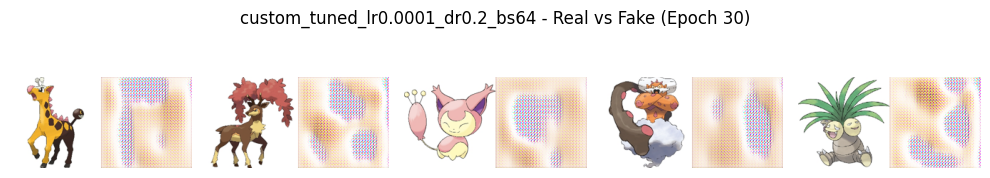

FID at Epoch 30: 417.92


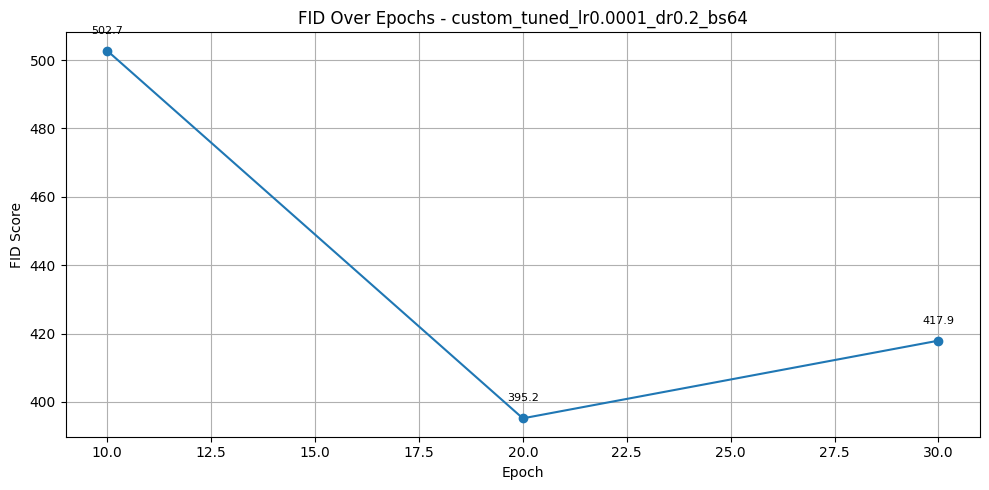

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Classifier Acc → Train: 52.19%, Test: 51.15%
FID (Custom, Test): 430.53
Custom GAN Combo: LR=0.0001, Dropout=0.2, Batch=128
Epoch 1 - G: 2.8020 | D: 0.3809
Epoch 2 - G: 4.9123 | D: 0.0089
Epoch 3 - G: 0.4002 | D: 1.1971
Epoch 4 - G: 10.1300 | D: 0.0759
Epoch 5 - G: 6.1678 | D: 0.0024
Epoch 6 - G: 6.5900 | D: 0.0017
Epoch 7 - G: 7.4382 | D: 0.1351
Epoch 8 - G: 11.7779 | D: 0.0080
Epoch 9 - G: 8.5733 | D: 0.1055
Epoch 10 - G: 16.2347 | D: 0.0071


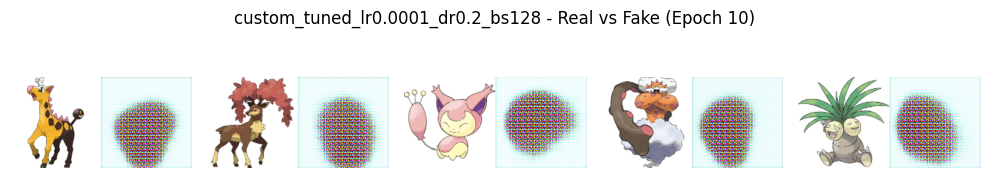

FID at Epoch 10: 377.18
Epoch 11 - G: 15.2509 | D: 0.0002
Epoch 12 - G: 12.9290 | D: 0.0378
Epoch 13 - G: 3.3097 | D: 0.3215
Epoch 14 - G: 20.2007 | D: 0.0001
Epoch 15 - G: 18.1269 | D: 0.0000
Epoch 16 - G: 29.2040 | D: 0.0136
Epoch 17 - G: 3.0343 | D: 0.1265
Epoch 18 - G: 5.1890 | D: 0.0261
Epoch 19 - G: 12.0638 | D: 0.0044
Epoch 20 - G: 16.3479 | D: 0.0342


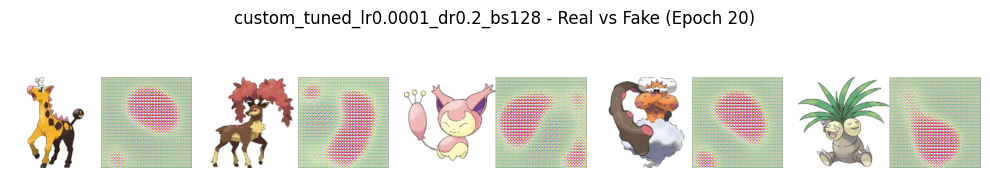

FID at Epoch 20: 499.95
Epoch 21 - G: 31.2882 | D: 0.0438
Epoch 22 - G: 64.3570 | D: 0.1389
Epoch 23 - G: 35.0469 | D: 0.1156
Epoch 24 - G: 30.1101 | D: 0.0027
Epoch 25 - G: 14.0298 | D: 0.2231
Epoch 26 - G: 20.4932 | D: 0.0000
Epoch 27 - G: 12.2036 | D: 0.0007
Epoch 28 - G: 14.7566 | D: 0.0001
Epoch 29 - G: 11.7464 | D: 0.0050
Epoch 30 - G: 11.1719 | D: 0.0014


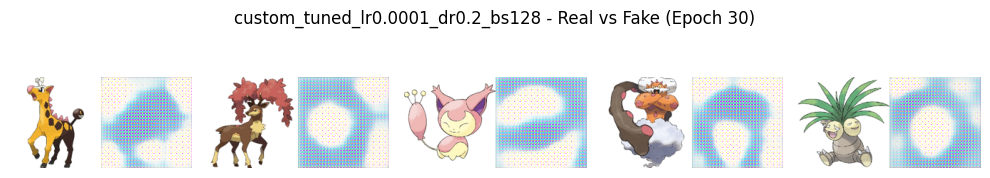

FID at Epoch 30: 415.09


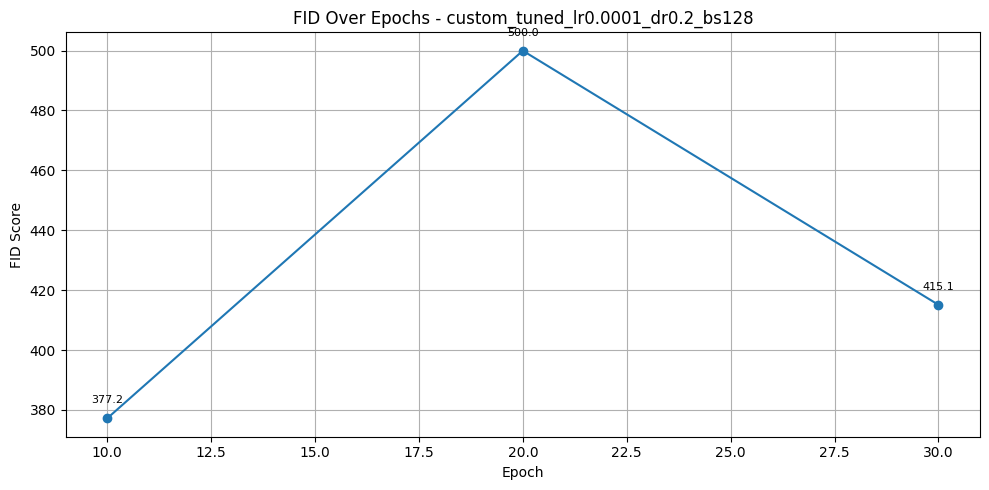

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Classifier Acc → Train: 99.71%, Test: 100.00%
FID (Custom, Test): 424.39
Custom GAN Combo: LR=0.0001, Dropout=0.3, Batch=64
Epoch 1 - G: 4.0159 | D: 0.0204
Epoch 2 - G: 10.7063 | D: 0.0001
Epoch 3 - G: 29.8820 | D: 0.0000
Epoch 4 - G: 20.0286 | D: 0.0000
Epoch 5 - G: 11.6672 | D: 0.0000
Epoch 6 - G: 9.0136 | D: 0.0002
Epoch 7 - G: 5.0513 | D: 0.0149
Epoch 8 - G: 3.7040 | D: 0.0865
Epoch 9 - G: 13.6466 | D: 0.0205
Epoch 10 - G: 10.2822 | D: 0.0001


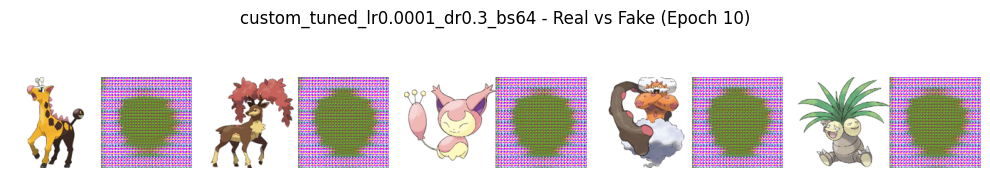

FID at Epoch 10: 381.71
Epoch 11 - G: 4.3940 | D: 0.0312
Epoch 12 - G: 9.8598 | D: 0.0004
Epoch 13 - G: 0.9827 | D: 1.3657
Epoch 14 - G: 14.3807 | D: 0.0004
Epoch 15 - G: 14.0350 | D: 0.0598
Epoch 16 - G: 87.1850 | D: 0.0266
Epoch 17 - G: 19.4330 | D: 0.0000
Epoch 18 - G: 22.7207 | D: 0.1494
Epoch 19 - G: 3.3962 | D: 0.2684
Epoch 20 - G: 6.4407 | D: 0.1157


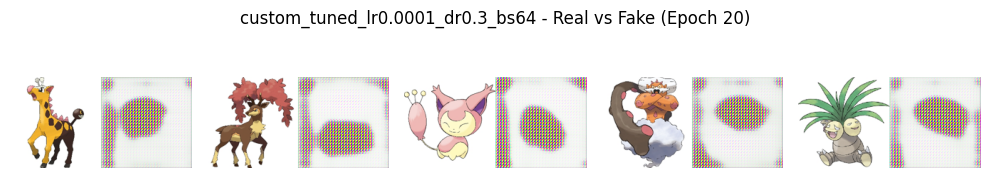

FID at Epoch 20: 441.08
Epoch 21 - G: 10.1916 | D: 0.0992
Epoch 22 - G: 8.1074 | D: 0.0468
Epoch 23 - G: 16.6645 | D: 0.0038
Epoch 24 - G: 17.7339 | D: 0.3979
Epoch 25 - G: 10.3817 | D: 0.0103
Epoch 26 - G: 14.4559 | D: 0.0013
Epoch 27 - G: 10.0241 | D: 0.0081
Epoch 28 - G: 8.9601 | D: 0.0362
Epoch 29 - G: 7.2137 | D: 0.0604
Epoch 30 - G: 12.0761 | D: 0.0003


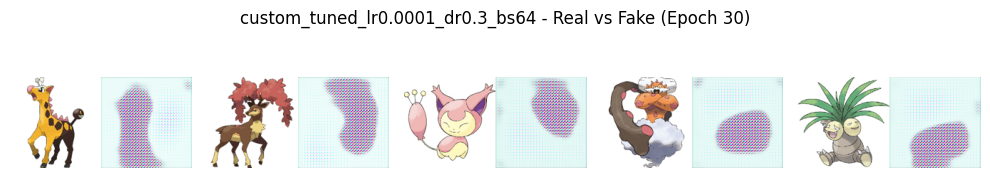

FID at Epoch 30: 376.58


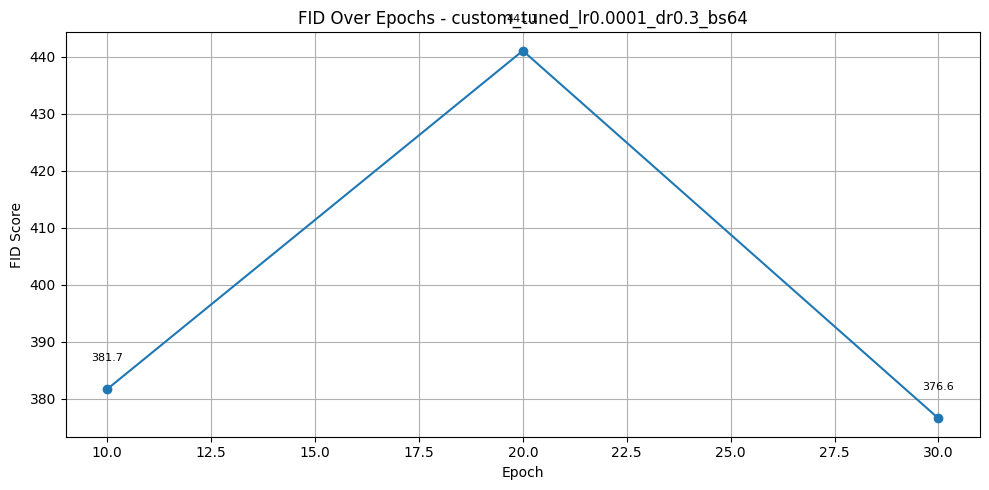

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Classifier Acc → Train: 70.04%, Test: 67.56%
FID (Custom, Test): 388.34
Custom GAN Combo: LR=0.0001, Dropout=0.3, Batch=128
Epoch 1 - G: 1.7289 | D: 0.2316
Epoch 2 - G: 9.6912 | D: 0.1156
Epoch 3 - G: 0.1292 | D: 2.3863
Epoch 4 - G: 12.0708 | D: 1.2455
Epoch 5 - G: 8.6222 | D: 0.0012
Epoch 6 - G: 3.6009 | D: 0.0384
Epoch 7 - G: 6.3871 | D: 0.0377
Epoch 8 - G: 7.7432 | D: 0.4507
Epoch 9 - G: 7.7071 | D: 0.0053
Epoch 10 - G: 7.6109 | D: 0.0021


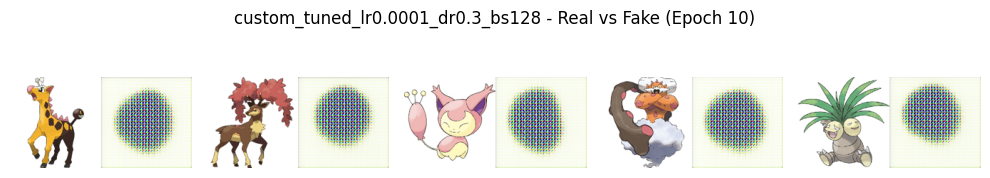

FID at Epoch 10: 424.56
Epoch 11 - G: 5.7383 | D: 0.0127
Epoch 12 - G: 3.5200 | D: 0.2009
Epoch 13 - G: 6.1311 | D: 0.1206
Epoch 14 - G: 5.0200 | D: 0.1943
Epoch 15 - G: 7.3135 | D: 0.1817
Epoch 16 - G: 7.4439 | D: 0.0096
Epoch 17 - G: 10.8298 | D: 0.0019
Epoch 18 - G: 16.4345 | D: 0.0001
Epoch 19 - G: 16.0531 | D: 0.0000
Epoch 20 - G: 12.1444 | D: 0.0014


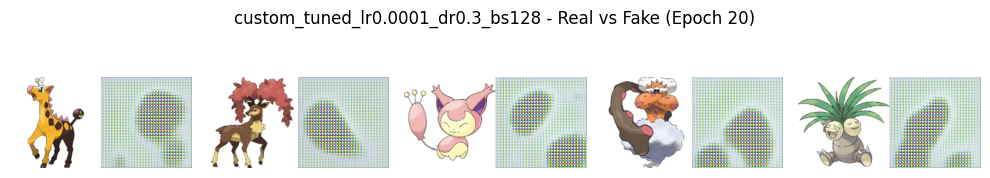

FID at Epoch 20: 384.27
Epoch 21 - G: 16.4096 | D: 0.1184
Epoch 22 - G: 19.5171 | D: 0.1881
Epoch 23 - G: 30.6834 | D: 0.0022
Epoch 24 - G: 28.4559 | D: 0.0003
Epoch 25 - G: 9.8584 | D: 0.0377
Epoch 26 - G: 14.7143 | D: 0.0000
Epoch 27 - G: 9.9830 | D: 0.0014
Epoch 28 - G: 19.1885 | D: 0.0010
Epoch 29 - G: 16.0966 | D: 0.1097
Epoch 30 - G: 0.2975 | D: 3.2976


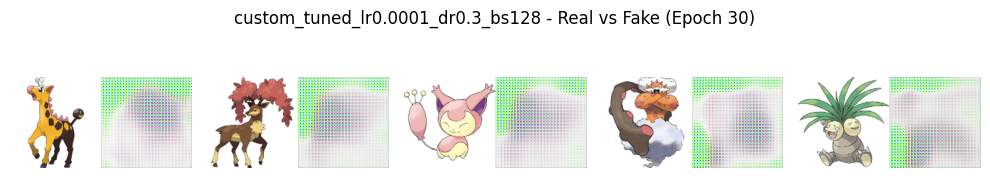

FID at Epoch 30: 478.77


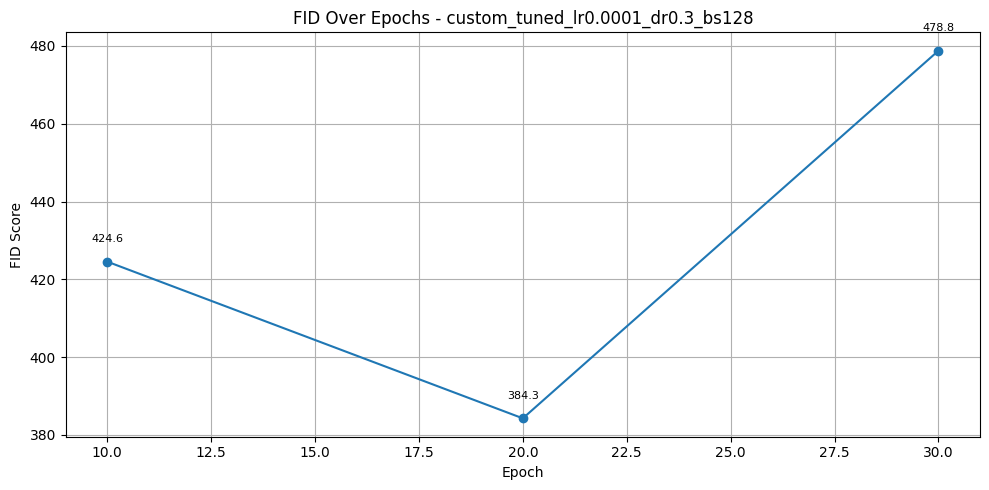

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Classifier Acc → Train: 50.38%, Test: 48.47%
FID (Custom, Test): 487.57
Custom GAN Combo: LR=0.0002, Dropout=0.2, Batch=64
Epoch 1 - G: 6.8034 | D: 0.0044
Epoch 2 - G: 18.8670 | D: 0.0208
Epoch 3 - G: 3.5330 | D: 0.0315
Epoch 4 - G: 3.3549 | D: 0.0417
Epoch 5 - G: 3.1767 | D: 0.0695
Epoch 6 - G: 4.6907 | D: 0.0324
Epoch 7 - G: 7.8916 | D: 0.1186
Epoch 8 - G: 5.8307 | D: 0.1305
Epoch 9 - G: 7.5736 | D: 0.0066
Epoch 10 - G: 3.5639 | D: 0.2053


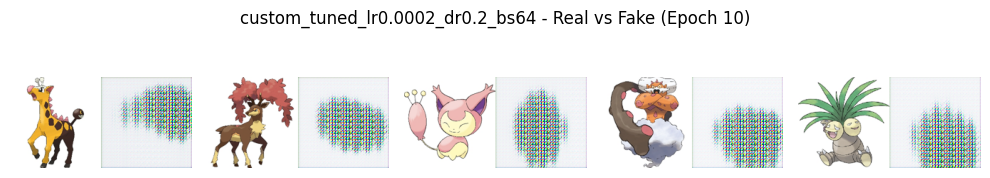

FID at Epoch 10: 376.95
Epoch 11 - G: 6.6119 | D: 0.0254
Epoch 12 - G: 5.2643 | D: 0.0273
Epoch 13 - G: 13.1531 | D: 0.0475
Epoch 14 - G: 20.7364 | D: 1.5575
Epoch 15 - G: 3.4194 | D: 0.5178
Epoch 16 - G: 12.7577 | D: 0.0623
Epoch 17 - G: 13.9650 | D: 0.0042
Epoch 18 - G: 14.0662 | D: 0.0151
Epoch 19 - G: 8.5165 | D: 0.0111
Epoch 20 - G: 12.3554 | D: 0.0305


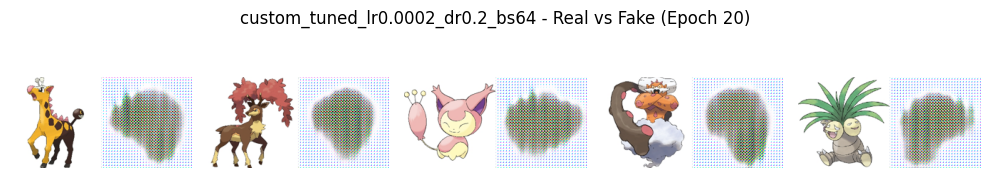

FID at Epoch 20: 426.38
Epoch 21 - G: 22.4072 | D: 5.2897
Epoch 22 - G: 12.1463 | D: 0.0899
Epoch 23 - G: 19.8191 | D: 0.0704
Epoch 24 - G: 24.4334 | D: 0.1954
Epoch 25 - G: 5.5082 | D: 0.7905
Epoch 26 - G: 2.6324 | D: 0.3386
Epoch 27 - G: 4.5432 | D: 0.0228
Epoch 28 - G: 6.4065 | D: 0.1828
Epoch 29 - G: 5.1189 | D: 0.1732
Epoch 30 - G: 4.8824 | D: 0.0924


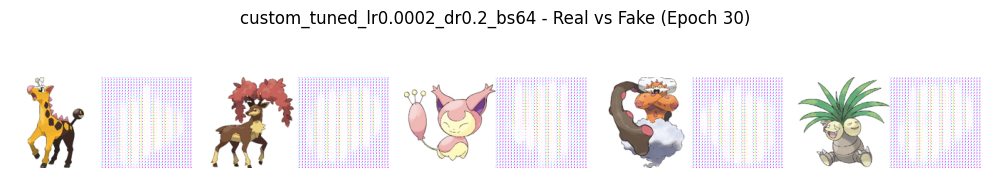

FID at Epoch 30: 384.78


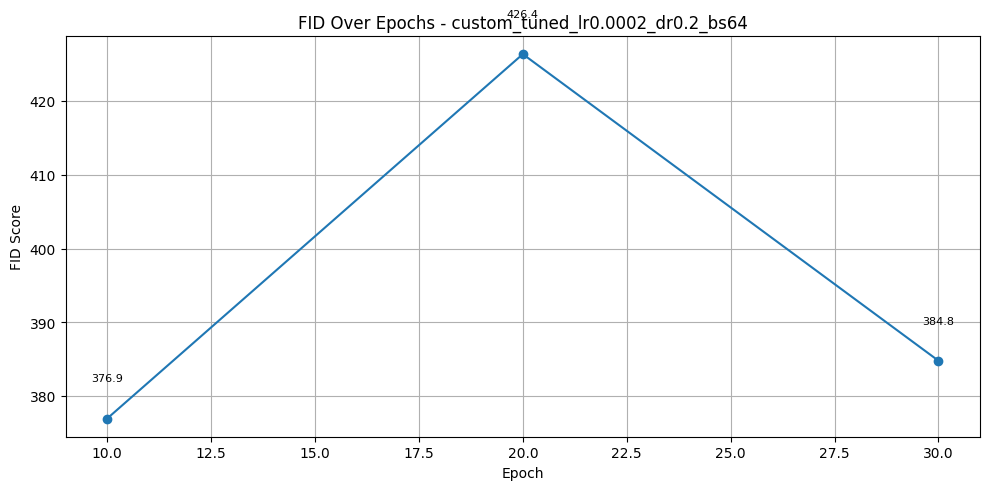

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Classifier Acc → Train: 49.62%, Test: 51.53%
FID (Custom, Test): 392.42
Custom GAN Combo: LR=0.0002, Dropout=0.2, Batch=128
Epoch 1 - G: 3.0738 | D: 0.1305
Epoch 2 - G: 2.1350 | D: 0.1329
Epoch 3 - G: 17.6441 | D: 1.4675
Epoch 4 - G: 15.0082 | D: 0.0000
Epoch 5 - G: 9.6977 | D: 0.0001
Epoch 6 - G: 14.6155 | D: 0.1187
Epoch 7 - G: 5.1520 | D: 0.0069
Epoch 8 - G: 13.8921 | D: 0.0004
Epoch 9 - G: 7.2227 | D: 0.2489
Epoch 10 - G: 5.5784 | D: 0.0643


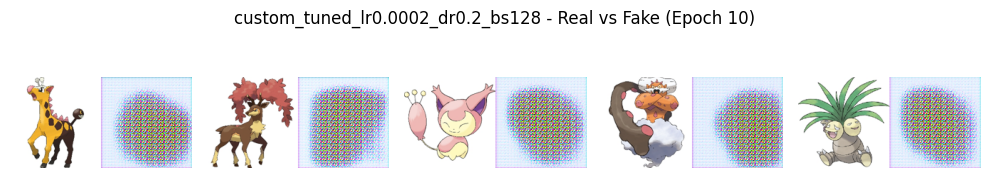

FID at Epoch 10: 392.10
Epoch 11 - G: 5.3420 | D: 0.0801
Epoch 12 - G: 14.4575 | D: 0.0002
Epoch 13 - G: 24.1507 | D: 0.0062
Epoch 14 - G: 8.3096 | D: 0.0095
Epoch 15 - G: 8.5646 | D: 0.0144
Epoch 16 - G: 18.5515 | D: 0.0000
Epoch 17 - G: 23.1338 | D: 0.0161
Epoch 18 - G: 58.2848 | D: 0.0612
Epoch 19 - G: 27.6249 | D: 0.0007
Epoch 20 - G: 18.3520 | D: 0.3140


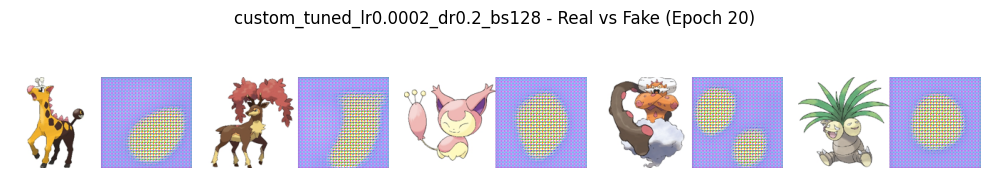

FID at Epoch 20: 409.51
Epoch 21 - G: 20.4502 | D: 0.0001
Epoch 22 - G: 38.3443 | D: 0.0000
Epoch 23 - G: 29.3738 | D: 0.0003
Epoch 24 - G: 14.4716 | D: 0.0003
Epoch 25 - G: 16.3506 | D: 0.0209
Epoch 26 - G: 28.3452 | D: 0.0924
Epoch 27 - G: 26.5384 | D: 0.0679
Epoch 28 - G: 43.2811 | D: 0.0435
Epoch 29 - G: 51.7918 | D: 0.0003
Epoch 30 - G: 35.4624 | D: 0.0002


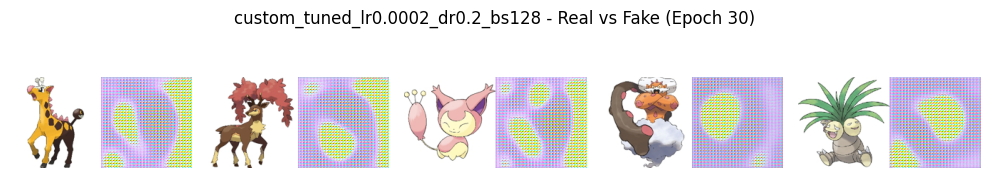

FID at Epoch 30: 488.41


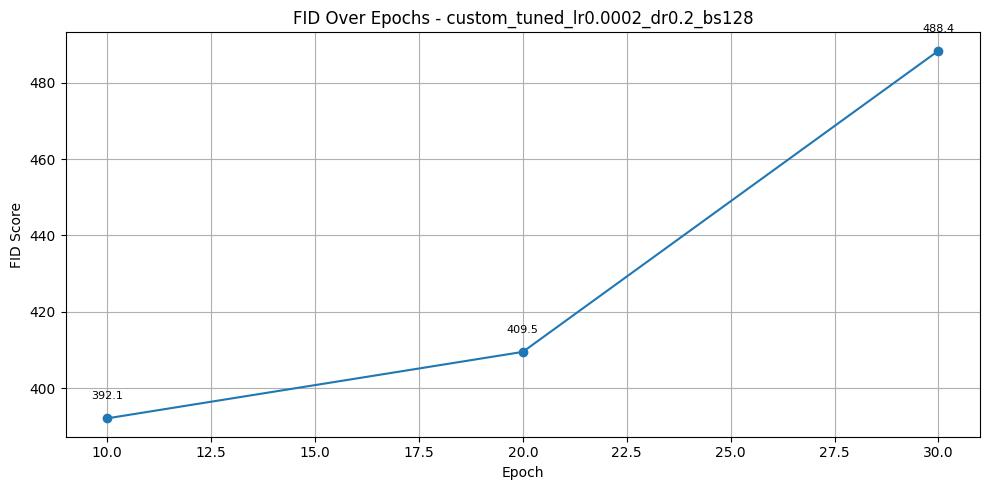

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Classifier Acc → Train: 50.00%, Test: 51.53%
FID (Custom, Test): 498.32
Custom GAN Combo: LR=0.0002, Dropout=0.3, Batch=64
Epoch 1 - G: 3.3031 | D: 0.0423
Epoch 2 - G: 12.6925 | D: 0.0012
Epoch 3 - G: 14.1205 | D: 0.0000
Epoch 4 - G: 4.7992 | D: 0.0142
Epoch 5 - G: 30.2107 | D: 0.0236
Epoch 6 - G: 8.4056 | D: 0.0108
Epoch 7 - G: 9.0955 | D: 0.0016
Epoch 8 - G: 3.2555 | D: 0.1080
Epoch 9 - G: 8.6445 | D: 0.0065
Epoch 10 - G: 6.1827 | D: 0.0134


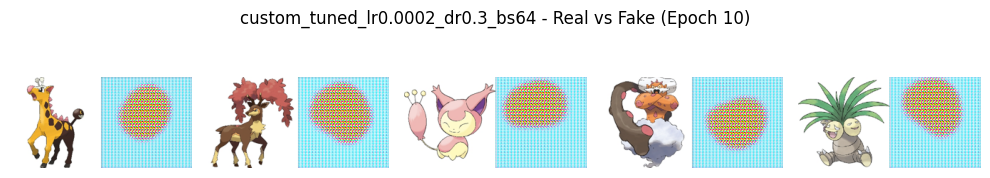

FID at Epoch 10: 513.56
Epoch 11 - G: 6.4135 | D: 0.0094
Epoch 12 - G: 20.2102 | D: 0.0237
Epoch 13 - G: 28.6537 | D: 0.0000
Epoch 14 - G: 47.3418 | D: 0.0000
Epoch 15 - G: 36.1090 | D: 0.0000
Epoch 16 - G: 25.1395 | D: 0.0749
Epoch 17 - G: 14.1854 | D: 0.1820
Epoch 18 - G: 15.2809 | D: 0.0436
Epoch 19 - G: 9.4123 | D: 0.0036
Epoch 20 - G: 6.4990 | D: 1.0855


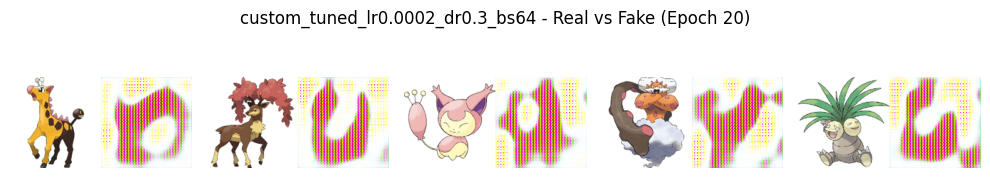

FID at Epoch 20: 397.91
Epoch 21 - G: 8.7655 | D: 0.1112
Epoch 22 - G: 15.1650 | D: 0.0008
Epoch 23 - G: 9.0465 | D: 0.6687
Epoch 24 - G: 7.7748 | D: 0.0227
Epoch 25 - G: 5.3495 | D: 0.0188
Epoch 26 - G: 4.7094 | D: 0.0356
Epoch 27 - G: 6.1211 | D: 0.0246
Epoch 28 - G: 6.9413 | D: 0.0156
Epoch 29 - G: 6.4762 | D: 0.0119
Epoch 30 - G: 7.1953 | D: 0.0317


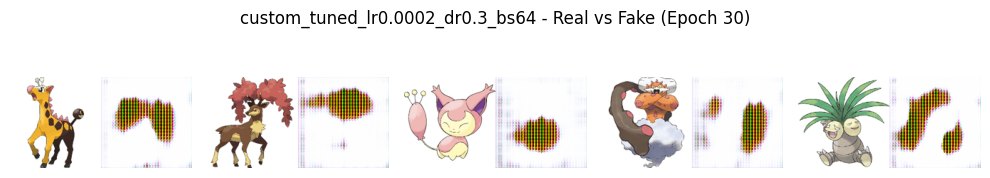

FID at Epoch 30: 324.69


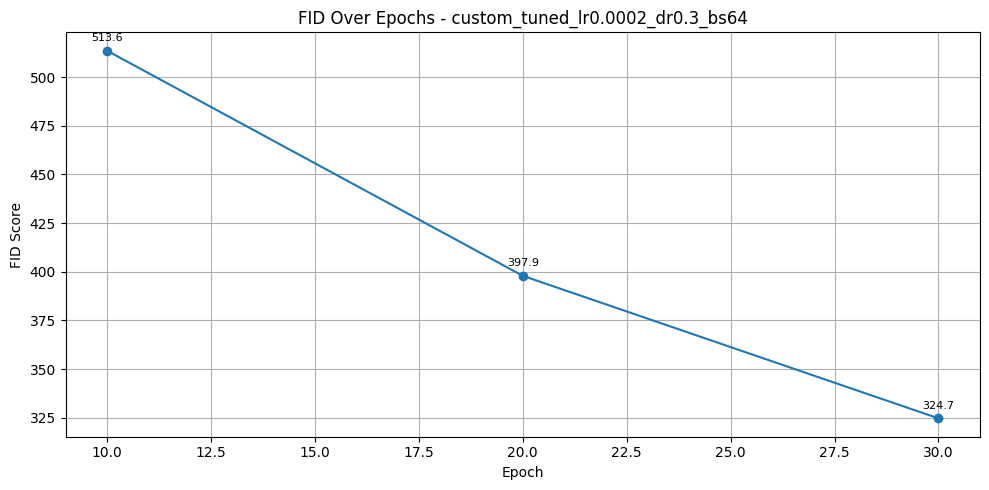

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Classifier Acc → Train: 50.38%, Test: 48.47%
FID (Custom, Test): 337.95
Custom GAN Combo: LR=0.0002, Dropout=0.3, Batch=128
Epoch 1 - G: 3.2944 | D: 0.2387
Epoch 2 - G: 3.7294 | D: 0.0273
Epoch 3 - G: 14.8963 | D: 0.6243
Epoch 4 - G: 4.9261 | D: 0.0095
Epoch 5 - G: 8.6488 | D: 0.0002
Epoch 6 - G: 3.9394 | D: 0.0262
Epoch 7 - G: 7.3672 | D: 0.0009
Epoch 8 - G: 2.6396 | D: 0.0998
Epoch 9 - G: 3.5808 | D: 0.0489
Epoch 10 - G: 8.7652 | D: 0.0005


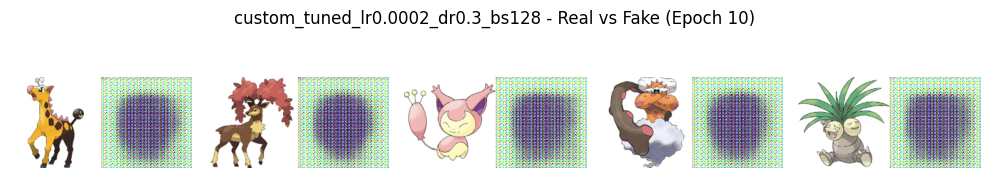

FID at Epoch 10: 458.60
Epoch 11 - G: 2.9454 | D: 0.0835
Epoch 12 - G: 5.0625 | D: 0.0200
Epoch 13 - G: 5.3380 | D: 1.2019
Epoch 14 - G: 6.9787 | D: 0.0133
Epoch 15 - G: 6.0337 | D: 0.0854
Epoch 16 - G: 3.5535 | D: 0.3249
Epoch 17 - G: 6.3314 | D: 0.0989
Epoch 18 - G: 5.0434 | D: 0.0443
Epoch 19 - G: 4.8280 | D: 0.2827
Epoch 20 - G: 16.3459 | D: 0.0077


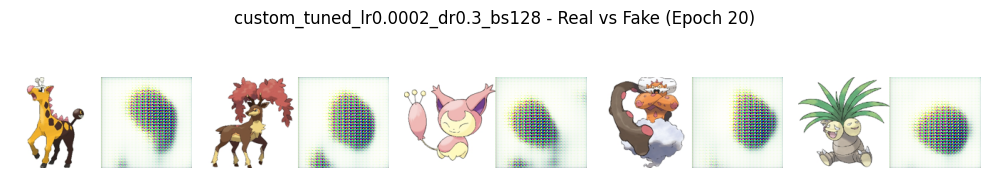

FID at Epoch 20: 447.04
Epoch 21 - G: 8.0765 | D: 0.0604
Epoch 22 - G: 7.9757 | D: 0.0124
Epoch 23 - G: 12.1577 | D: 0.0019
Epoch 24 - G: 7.7587 | D: 0.0387
Epoch 25 - G: 12.0680 | D: 0.0441
Epoch 26 - G: 21.2264 | D: 0.0012
Epoch 27 - G: 15.8510 | D: 0.0362
Epoch 28 - G: 8.7978 | D: 0.1218
Epoch 29 - G: 5.2142 | D: 3.3019
Epoch 30 - G: 79.0981 | D: 0.0000


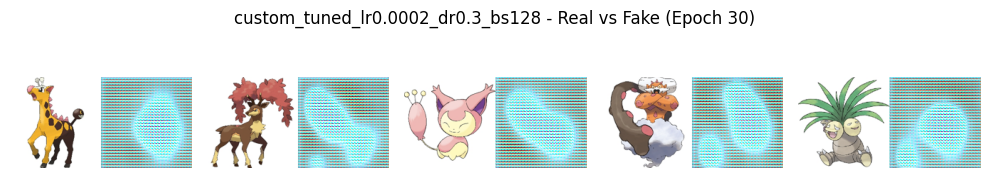

FID at Epoch 30: 358.13


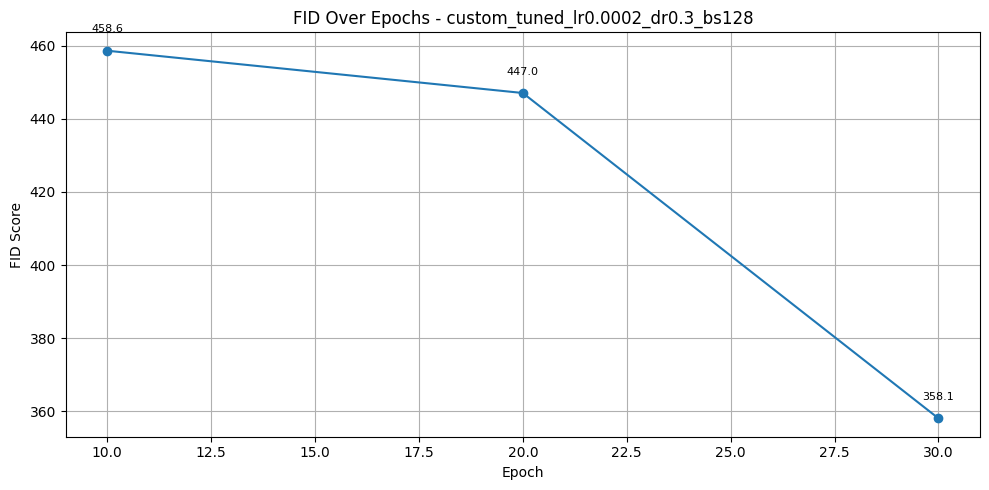

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Classifier Acc → Train: 49.62%, Test: 51.53%
FID (Custom, Test): 366.69

Best Custom DCGAN Params:
LR: 0.0002, Dropout: 0.3, Batch: 64
Best FID: 337.95


In [19]:
from itertools import product

custom_results =[]

# Define hyperparameter grid
learning_rates = [1e-4, 2e-4]
dropout_rates = [0.2, 0.3]
batch_sizes = [64, 128]
param_combos = list(product(learning_rates, dropout_rates, batch_sizes))

# Track best custom DCGAN
best_fid_cus = float("inf")
best_combo_cus = None
best_model_cus = None

# Track best standard DCGAN
best_fid_std = float("inf")
best_combo_std = None
best_model_std = None

# Store original values
original_epochs = EPOCHS
original_batch_size = BATCH_SIZE
EPOCHS = 30  # Reduce for tuning

print("Starting Hyperparameter Tuning for Custom DCGAN...\n")

for lr, dropout, bsz in param_combos:
    print(f"Custom GAN Combo: LR={lr}, Dropout={dropout}, Batch={bsz}")
    BATCH_SIZE = bsz

    # Generator
    def tuned_generator():
        inputs = tf.keras.Input(shape=(LATENT_DIM,))
        x = layers.Dense(8 * 8 * 1024)(inputs)
        x = layers.Reshape((8, 8, 1024))(x)
        x = layers.LeakyReLU()(x)
        for filters in [512, 256, 128, 64]:
            x = layers.Conv2DTranspose(filters, 5, strides=2, padding='same')(x)
            x = InstanceNormalization()(x)
            x = layers.LeakyReLU()(x)
            x = layers.Dropout(dropout)(x, training=True)
        x = layers.Conv2DTranspose(3, 5, strides=1, padding='same', activation='tanh')(x)
        return tf.keras.Model(inputs, x)

    def tuned_discriminator():
        inputs = tf.keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
        x = inputs
        for filters, strides in zip([64, 128, 256, 512, 1024], [2, 2, 2, 1, 2]):
            x = layers.Conv2D(filters, 5, strides=strides, padding='same')(x)
            x = layers.LeakyReLU()(x)
            x = layers.Dropout(dropout)(x)
        x = layers.Flatten()(x)
        x = layers.Dense(1, activation='sigmoid')(x)
        return tf.keras.Model(inputs, x)

    custom_gen = tuned_generator()
    custom_disc = tuned_discriminator()

    train_dcgan(custom_gen, custom_disc, train_images, f"custom_tuned_lr{lr}_dr{dropout}_bs{bsz}")
    fake_path = os.path.join(SAVE_DIR, f"fid_custom_tuned_lr{lr}_dr{dropout}_bs{bsz}")
    fid = calculate_fid(os.path.join(SAVE_DIR, "fid_real_test"), fake_path)
    
    # Evaluate real-vs-fake classifier on generated images
    Xtr_cus, Xte_cus, ytr_cus, yte_cus = load_classifier_data(custom_gen, train_images)
    clf_cus = build_classifier()
    clf_cus.fit(Xtr_cus, ytr_cus, epochs=5, verbose=0)
    
    acc_train = smoothed_accuracy(ytr_cus, clf_cus.predict(Xtr_cus).ravel())
    acc_test = smoothed_accuracy(yte_cus, clf_cus.predict(Xte_cus).ravel())
    
    print(f"Classifier Acc → Train: {acc_train:.2%}, Test: {acc_test:.2%}")

    print(f"FID (Custom, Test): {fid:.2f}")
    if fid < best_fid_cus:
        best_fid_cus = fid
        best_combo_cus = (lr, dropout, bsz)
        best_model_cus = custom_gen
    custom_results.append((bsz, lr, dropout, fid, acc_test))

print("\nBest Custom DCGAN Params:")
print(f"LR: {best_combo_cus[0]}, Dropout: {best_combo_cus[1]}, Batch: {best_combo_cus[2]}")
print(f"Best FID: {best_fid_cus:.2f}")

## Standard DCGAN Tuning


Starting Hyperparameter Tuning for Standard DCGAN...

Standard GAN Combo: LR=0.0001, Dropout=0.2, Batch=64
Epoch 1 - G: 0.7582 | D: 0.7462
Epoch 2 - G: 1.8116 | D: 0.2538
Epoch 3 - G: 2.1544 | D: 0.1738
Epoch 4 - G: 3.2796 | D: 0.0484
Epoch 5 - G: 4.1147 | D: 0.0732
Epoch 6 - G: 3.6112 | D: 0.0288
Epoch 7 - G: 3.3006 | D: 0.0578
Epoch 8 - G: 5.0841 | D: 0.0229
Epoch 9 - G: 4.7403 | D: 0.0113
Epoch 10 - G: 3.3098 | D: 0.0445


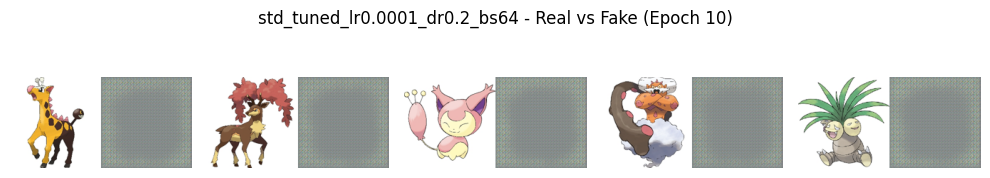

FID at Epoch 10: 472.46
Epoch 11 - G: 5.9034 | D: 0.2925
Epoch 12 - G: 4.8999 | D: 0.2365
Epoch 13 - G: 4.1136 | D: 0.1061
Epoch 14 - G: 5.6672 | D: 0.0431
Epoch 15 - G: 10.5652 | D: 0.5626
Epoch 16 - G: 8.5730 | D: 0.0130
Epoch 17 - G: 6.6158 | D: 0.0811
Epoch 18 - G: 2.4207 | D: 0.1163
Epoch 19 - G: 4.5322 | D: 0.0191
Epoch 20 - G: 3.5964 | D: 0.0442


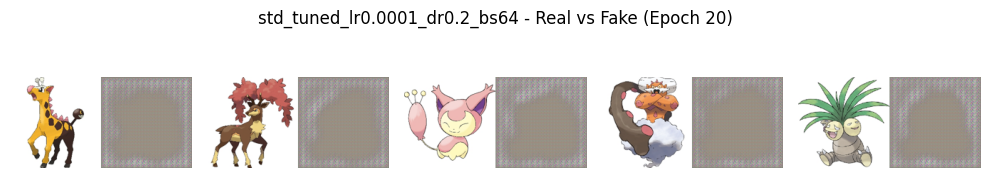

FID at Epoch 20: 520.86
Epoch 21 - G: 4.8964 | D: 0.0152
Epoch 22 - G: 3.6743 | D: 0.2062
Epoch 23 - G: 6.9959 | D: 0.0020
Epoch 24 - G: 5.2114 | D: 0.3980
Epoch 25 - G: 4.9640 | D: 0.0395
Epoch 26 - G: 7.3513 | D: 0.0077
Epoch 27 - G: 6.3476 | D: 0.0403
Epoch 28 - G: 8.3176 | D: 0.0820
Epoch 29 - G: 5.0663 | D: 0.5089
Epoch 30 - G: 4.4356 | D: 0.0288


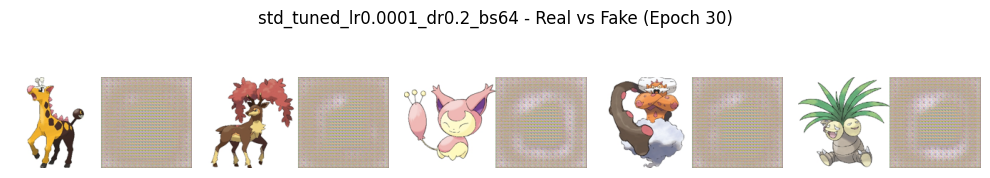

FID at Epoch 30: 379.41


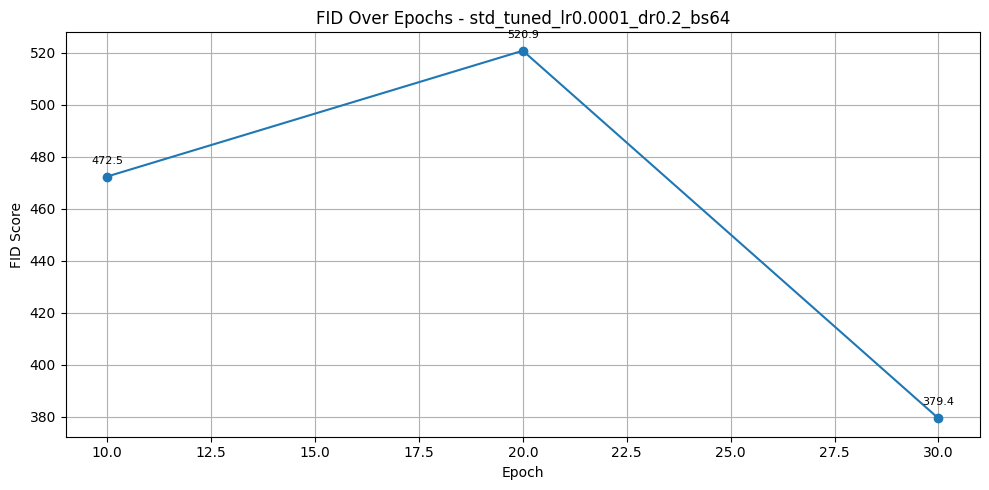

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Classifier Acc → Train: 58.68%, Test: 57.25%
FID (Standard, Test): 388.71
Standard GAN Combo: LR=0.0001, Dropout=0.2, Batch=128
Epoch 1 - G: 0.6567 | D: 0.8979
Epoch 2 - G: 1.2465 | D: 0.3657
Epoch 3 - G: 3.1838 | D: 0.0605
Epoch 4 - G: 3.8934 | D: 0.0275
Epoch 5 - G: 3.5833 | D: 0.0316
Epoch 6 - G: 4.2909 | D: 0.0726
Epoch 7 - G: 4.2558 | D: 0.0144
Epoch 8 - G: 5.1301 | D: 0.0159
Epoch 9 - G: 5.2735 | D: 0.0052
Epoch 10 - G: 5.5945 | D: 0.0048


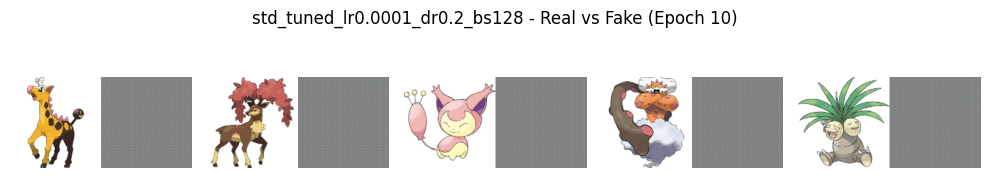

FID at Epoch 10: 413.46
Epoch 11 - G: 5.3988 | D: 0.0046
Epoch 12 - G: 5.5262 | D: 0.0041
Epoch 13 - G: 6.0052 | D: 0.0030
Epoch 14 - G: 5.6261 | D: 0.0816
Epoch 15 - G: 8.2200 | D: 0.0433
Epoch 16 - G: 4.2027 | D: 0.0154
Epoch 17 - G: 5.6827 | D: 0.0038
Epoch 18 - G: 5.1035 | D: 0.0066
Epoch 19 - G: 5.4033 | D: 0.0627
Epoch 20 - G: 4.9674 | D: 0.0078


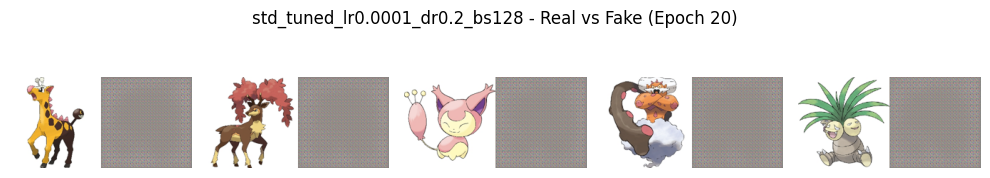

FID at Epoch 20: 410.15
Epoch 21 - G: 5.1084 | D: 0.0076
Epoch 22 - G: 3.0359 | D: 0.0542
Epoch 23 - G: 5.0257 | D: 0.0220
Epoch 24 - G: 4.2900 | D: 0.0571
Epoch 25 - G: 2.1523 | D: 0.1546
Epoch 26 - G: 3.1638 | D: 0.0666
Epoch 27 - G: 2.5332 | D: 0.0946
Epoch 28 - G: 4.1781 | D: 0.2304
Epoch 29 - G: 2.4265 | D: 0.1173
Epoch 30 - G: 4.5229 | D: 0.0322


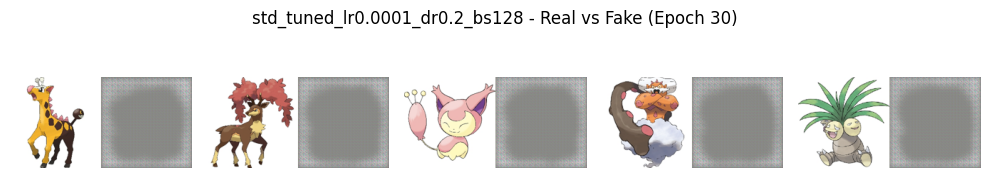

FID at Epoch 30: 416.84


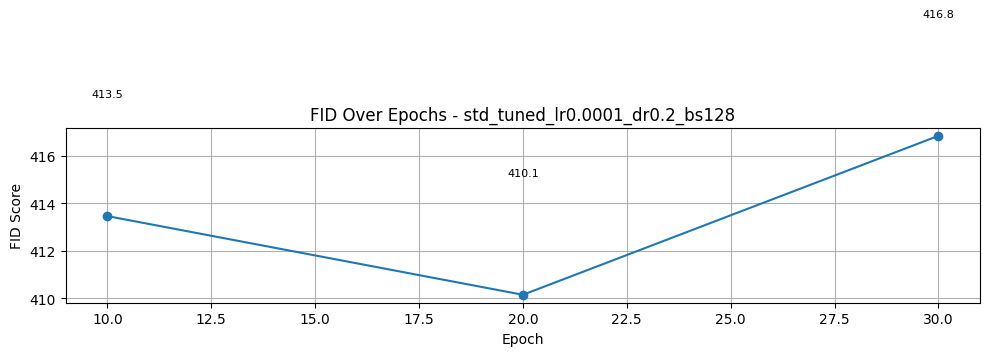

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Classifier Acc → Train: 78.91%, Test: 78.24%
FID (Standard, Test): 422.67
Standard GAN Combo: LR=0.0001, Dropout=0.3, Batch=64
Epoch 1 - G: 0.9101 | D: 0.5533
Epoch 2 - G: 2.9986 | D: 0.0743
Epoch 3 - G: 3.2545 | D: 0.0465
Epoch 4 - G: 3.6719 | D: 0.0340
Epoch 5 - G: 3.8722 | D: 0.0249
Epoch 6 - G: 4.4224 | D: 0.0199
Epoch 7 - G: 4.2279 | D: 0.0154
Epoch 8 - G: 4.8051 | D: 0.0090
Epoch 9 - G: 3.6601 | D: 0.0290
Epoch 10 - G: 5.1830 | D: 0.0113


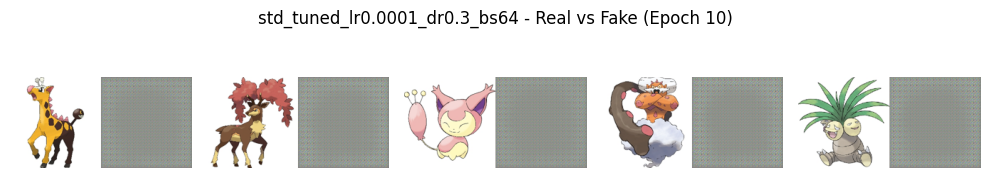

FID at Epoch 10: 474.14
Epoch 11 - G: 4.4889 | D: 0.0139
Epoch 12 - G: 4.1623 | D: 0.1102
Epoch 13 - G: 3.0300 | D: 0.1719
Epoch 14 - G: 4.2653 | D: 0.2412
Epoch 15 - G: 5.2999 | D: 0.0959
Epoch 16 - G: 3.3462 | D: 0.0425
Epoch 17 - G: 3.7813 | D: 0.0410
Epoch 18 - G: 6.4076 | D: 0.1566
Epoch 19 - G: 4.3212 | D: 0.0253
Epoch 20 - G: 5.0669 | D: 0.0378


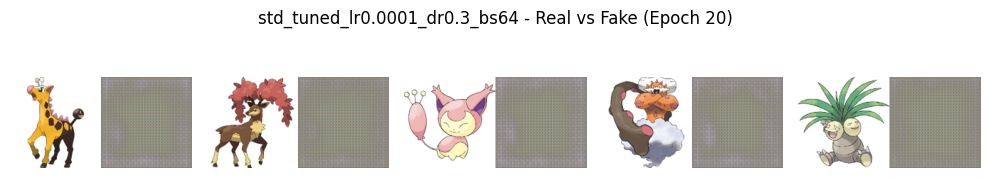

FID at Epoch 20: 487.00
Epoch 21 - G: 3.3897 | D: 0.0961
Epoch 22 - G: 5.1972 | D: 0.0353
Epoch 23 - G: 6.6478 | D: 0.0377
Epoch 24 - G: 8.7553 | D: 0.6368
Epoch 25 - G: 4.9721 | D: 0.1047
Epoch 26 - G: 6.9406 | D: 0.0074
Epoch 27 - G: 4.8289 | D: 0.0140
Epoch 28 - G: 7.3488 | D: 0.1918
Epoch 29 - G: 14.5603 | D: 0.5006
Epoch 30 - G: 8.8872 | D: 0.0464


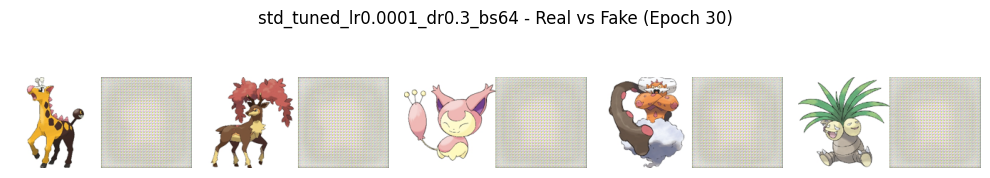

FID at Epoch 30: 412.59


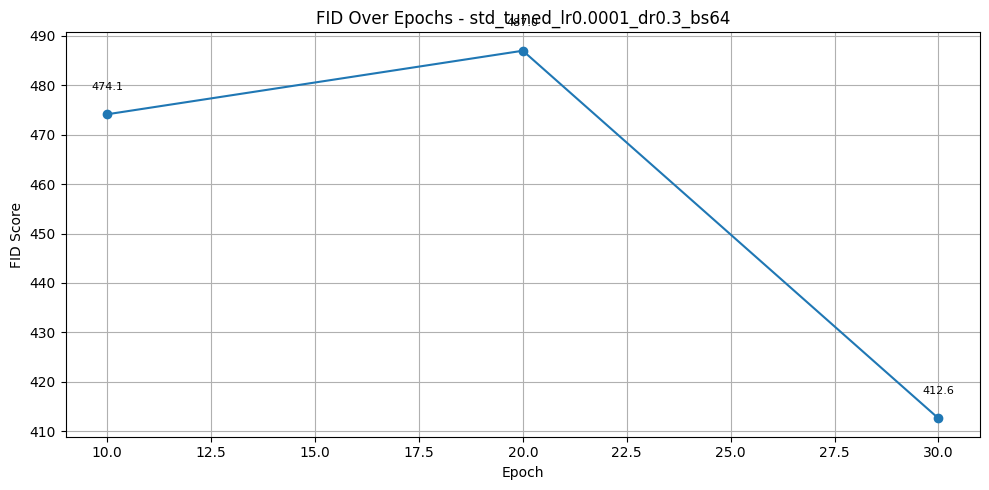

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Classifier Acc → Train: 50.38%, Test: 48.47%
FID (Standard, Test): 420.02
Standard GAN Combo: LR=0.0001, Dropout=0.3, Batch=128
Epoch 1 - G: 0.6176 | D: 0.9597
Epoch 2 - G: 1.1612 | D: 0.4329
Epoch 3 - G: 2.1492 | D: 0.1608
Epoch 4 - G: 2.2908 | D: 0.1923
Epoch 5 - G: 3.6786 | D: 0.0281
Epoch 6 - G: 3.6342 | D: 0.0308
Epoch 7 - G: 3.9502 | D: 0.0228
Epoch 8 - G: 3.4638 | D: 0.0326
Epoch 9 - G: 3.8936 | D: 0.0240
Epoch 10 - G: 4.6563 | D: 0.0110


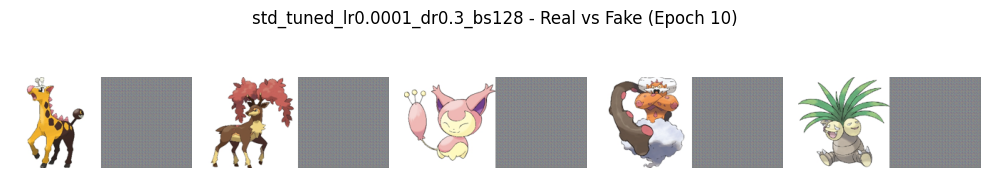

FID at Epoch 10: 418.38
Epoch 11 - G: 5.5917 | D: 0.0227
Epoch 12 - G: 6.1887 | D: 0.0098
Epoch 13 - G: 4.3903 | D: 0.0135
Epoch 14 - G: 5.1010 | D: 0.0096
Epoch 15 - G: 3.8297 | D: 0.0259
Epoch 16 - G: 4.3660 | D: 0.0207
Epoch 17 - G: 5.1674 | D: 0.0076
Epoch 18 - G: 3.6090 | D: 0.0362
Epoch 19 - G: 3.1792 | D: 0.0523
Epoch 20 - G: 3.4674 | D: 0.0408


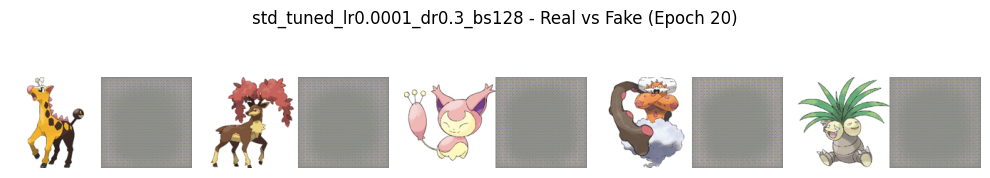

FID at Epoch 20: 401.82
Epoch 21 - G: 2.4860 | D: 0.1735
Epoch 22 - G: 4.4735 | D: 0.0509
Epoch 23 - G: 1.7001 | D: 0.3196
Epoch 24 - G: 1.9848 | D: 0.1723
Epoch 25 - G: 3.9633 | D: 0.0234
Epoch 26 - G: 3.5480 | D: 0.0348
Epoch 27 - G: 3.8387 | D: 0.0410
Epoch 28 - G: 3.7953 | D: 0.0807
Epoch 29 - G: 3.6831 | D: 0.0391
Epoch 30 - G: 3.6775 | D: 0.0420


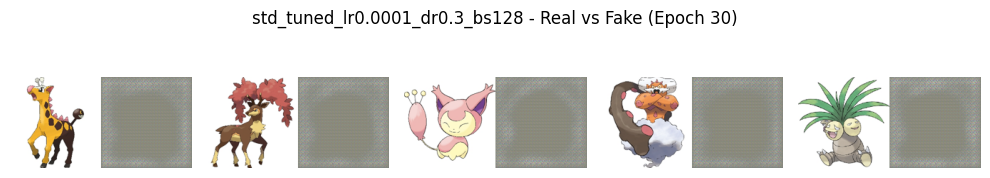

FID at Epoch 30: 397.69


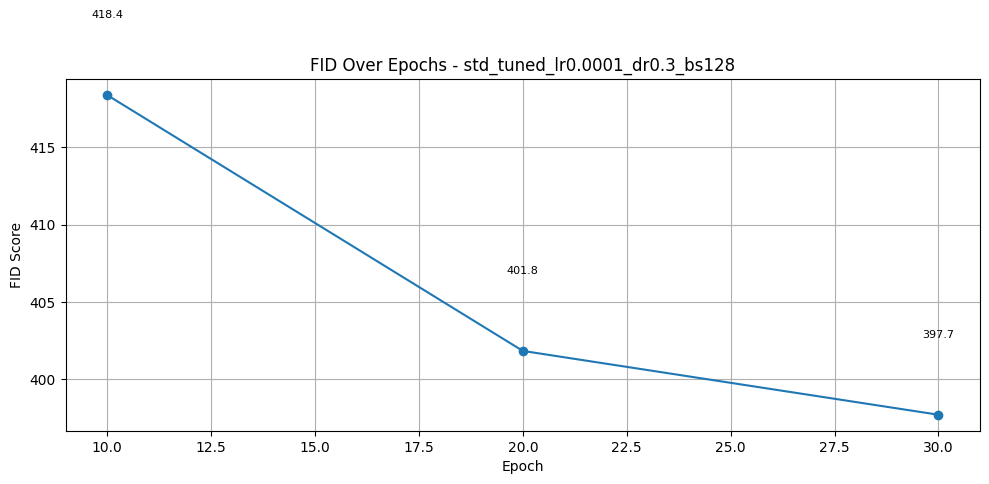

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Classifier Acc → Train: 49.62%, Test: 51.53%
FID (Standard, Test): 404.44
Standard GAN Combo: LR=0.0002, Dropout=0.2, Batch=64
Epoch 1 - G: 1.0702 | D: 0.4433
Epoch 2 - G: 4.1367 | D: 0.0255
Epoch 3 - G: 3.9490 | D: 0.0311
Epoch 4 - G: 3.4050 | D: 0.0581
Epoch 5 - G: 3.7117 | D: 0.0249
Epoch 6 - G: 4.4476 | D: 0.0120
Epoch 7 - G: 4.8689 | D: 0.0079
Epoch 8 - G: 3.9872 | D: 0.0200
Epoch 9 - G: 5.2421 | D: 0.0285
Epoch 10 - G: 4.5039 | D: 0.0221


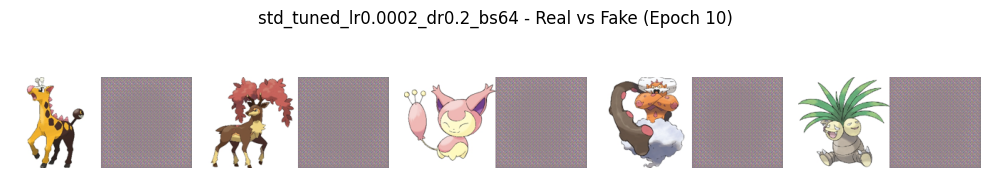

FID at Epoch 10: 387.77
Epoch 11 - G: 6.1841 | D: 0.0120
Epoch 12 - G: 4.6264 | D: 0.0113
Epoch 13 - G: 3.4439 | D: 0.0349
Epoch 14 - G: 5.0788 | D: 0.0069
Epoch 15 - G: 2.1287 | D: 0.1460
Epoch 16 - G: 1.6252 | D: 0.2575
Epoch 17 - G: 3.0471 | D: 0.0860
Epoch 18 - G: 4.3391 | D: 0.0206
Epoch 19 - G: 3.3557 | D: 0.0715
Epoch 20 - G: 4.3149 | D: 0.0514


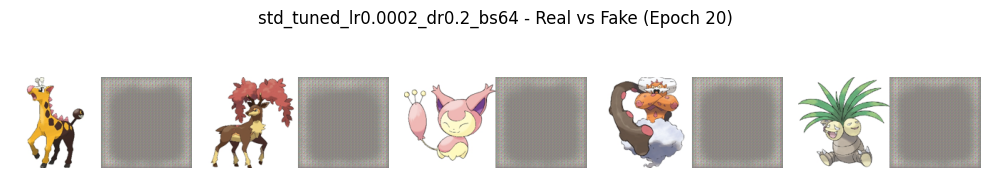

FID at Epoch 20: 449.42
Epoch 21 - G: 5.7553 | D: 0.0097
Epoch 22 - G: 4.4561 | D: 0.0350
Epoch 23 - G: 5.2663 | D: 0.0238
Epoch 24 - G: 6.2230 | D: 0.0534
Epoch 25 - G: 7.5059 | D: 0.0034
Epoch 26 - G: 5.6332 | D: 0.0241
Epoch 27 - G: 5.3391 | D: 0.2910
Epoch 28 - G: 4.3770 | D: 0.0618
Epoch 29 - G: 8.4720 | D: 0.0483
Epoch 30 - G: 6.7830 | D: 0.2378


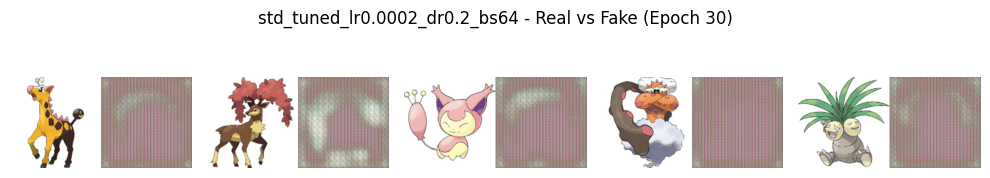

FID at Epoch 30: 513.57


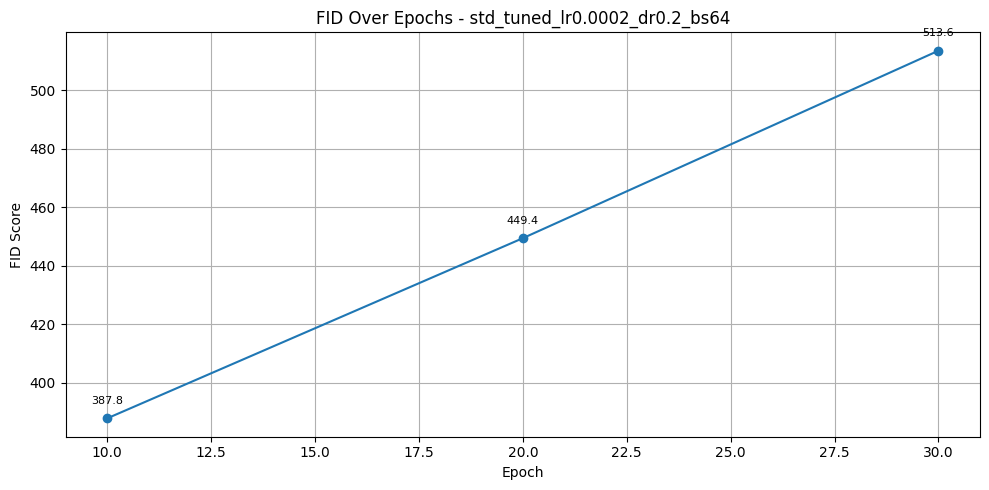

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
Classifier Acc → Train: 99.24%, Test: 99.62%
FID (Standard, Test): 522.15
Standard GAN Combo: LR=0.0002, Dropout=0.2, Batch=128
Epoch 1 - G: 0.6519 | D: 0.9899
Epoch 2 - G: 0.8333 | D: 0.6358
Epoch 3 - G: 1.5591 | D: 0.3341
Epoch 4 - G: 2.1994 | D: 0.1682
Epoch 5 - G: 3.3333 | D: 0.0521
Epoch 6 - G: 3.1604 | D: 0.0713
Epoch 7 - G: 3.0235 | D: 0.1095
Epoch 8 - G: 2.1920 | D: 0.1463
Epoch 9 - G: 4.0033 | D: 0.0313
Epoch 10 - G: 3.8616 | D: 0.0222


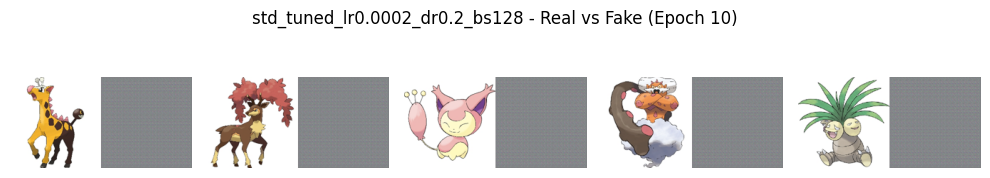

FID at Epoch 10: 409.74
Epoch 11 - G: 3.6790 | D: 0.0415
Epoch 12 - G: 4.1745 | D: 0.0205
Epoch 13 - G: 3.7260 | D: 0.0251
Epoch 14 - G: 3.2264 | D: 0.0442
Epoch 15 - G: 3.2161 | D: 0.0468
Epoch 16 - G: 4.2872 | D: 0.0164
Epoch 17 - G: 4.9968 | D: 0.0199
Epoch 18 - G: 5.1069 | D: 0.0075
Epoch 19 - G: 5.0586 | D: 0.0098
Epoch 20 - G: 3.0031 | D: 0.0544


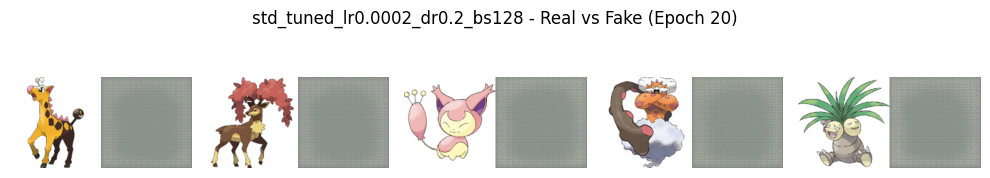

FID at Epoch 20: 438.72
Epoch 21 - G: 3.4495 | D: 0.0345
Epoch 22 - G: 3.5228 | D: 0.1410
Epoch 23 - G: 4.2380 | D: 0.6200
Epoch 24 - G: 5.1786 | D: 0.2542
Epoch 25 - G: 3.6932 | D: 0.3756
Epoch 26 - G: 2.0473 | D: 0.3596
Epoch 27 - G: 4.5580 | D: 0.0323
Epoch 28 - G: 4.7020 | D: 0.0910
Epoch 29 - G: 3.2255 | D: 0.0622
Epoch 30 - G: 4.7734 | D: 0.1699


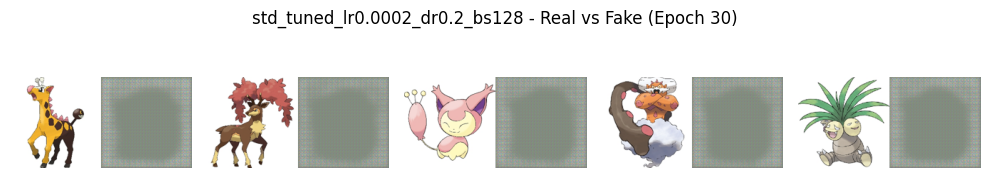

FID at Epoch 30: 456.25


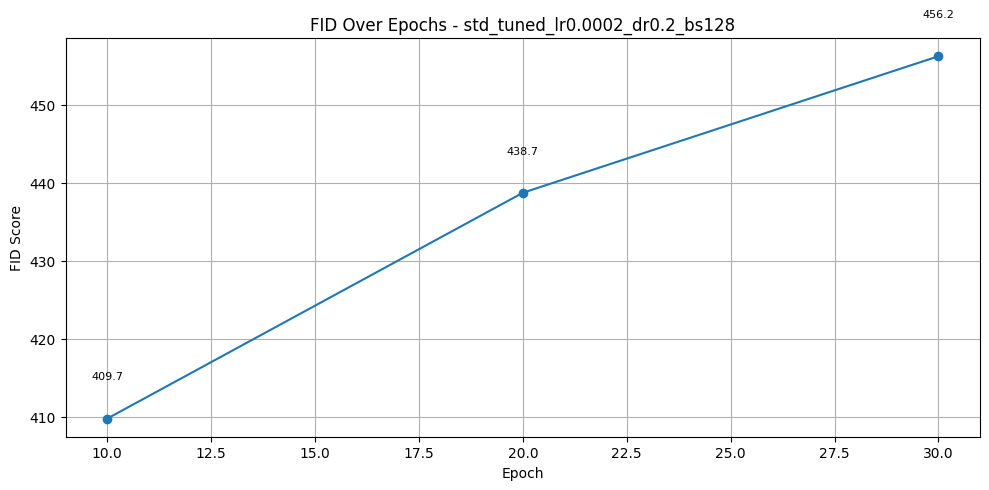

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
Classifier Acc → Train: 65.08%, Test: 62.21%
FID (Standard, Test): 462.97
Standard GAN Combo: LR=0.0002, Dropout=0.3, Batch=64
Epoch 1 - G: 0.8554 | D: 0.5886
Epoch 2 - G: 3.0774 | D: 0.0656
Epoch 3 - G: 1.9056 | D: 0.2172
Epoch 4 - G: 3.4615 | D: 0.1032
Epoch 5 - G: 2.9292 | D: 0.0869
Epoch 6 - G: 4.9032 | D: 0.0101
Epoch 7 - G: 3.2488 | D: 0.0494
Epoch 8 - G: 3.4265 | D: 0.0427
Epoch 9 - G: 5.0999 | D: 0.0147
Epoch 10 - G: 3.7771 | D: 0.0256


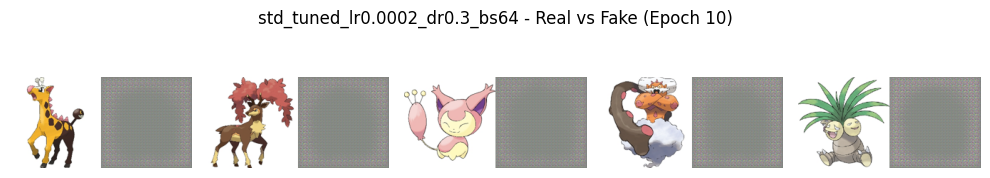

FID at Epoch 10: 405.96
Epoch 11 - G: 3.9000 | D: 0.0227
Epoch 12 - G: 2.9868 | D: 0.0734
Epoch 13 - G: 6.7888 | D: 0.1510
Epoch 14 - G: 2.5865 | D: 0.0885
Epoch 15 - G: 4.4129 | D: 0.3398
Epoch 16 - G: 4.0022 | D: 0.0243
Epoch 17 - G: 5.0379 | D: 0.0145
Epoch 18 - G: 4.7709 | D: 0.0259
Epoch 19 - G: 6.4272 | D: 0.0863
Epoch 20 - G: 6.0720 | D: 0.0857


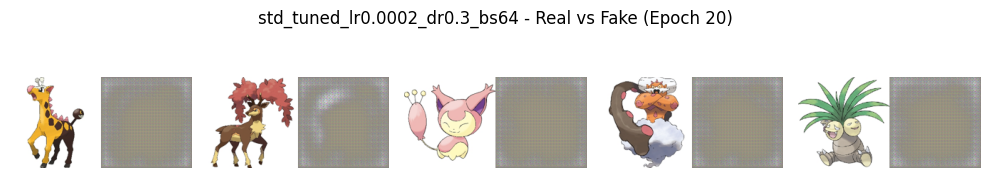

FID at Epoch 20: 395.85
Epoch 21 - G: 3.5649 | D: 0.0737
Epoch 22 - G: 1.4550 | D: 0.3272
Epoch 23 - G: 5.0280 | D: 0.0148
Epoch 24 - G: 2.6135 | D: 0.1408
Epoch 25 - G: 3.1595 | D: 0.1485
Epoch 26 - G: 6.6564 | D: 0.0050
Epoch 27 - G: 9.1701 | D: 0.0009
Epoch 28 - G: 9.0779 | D: 0.2561
Epoch 29 - G: 3.8776 | D: 0.2520
Epoch 30 - G: 3.8207 | D: 0.3925


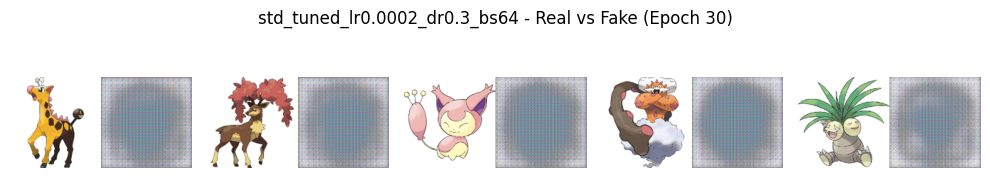

FID at Epoch 30: 410.95


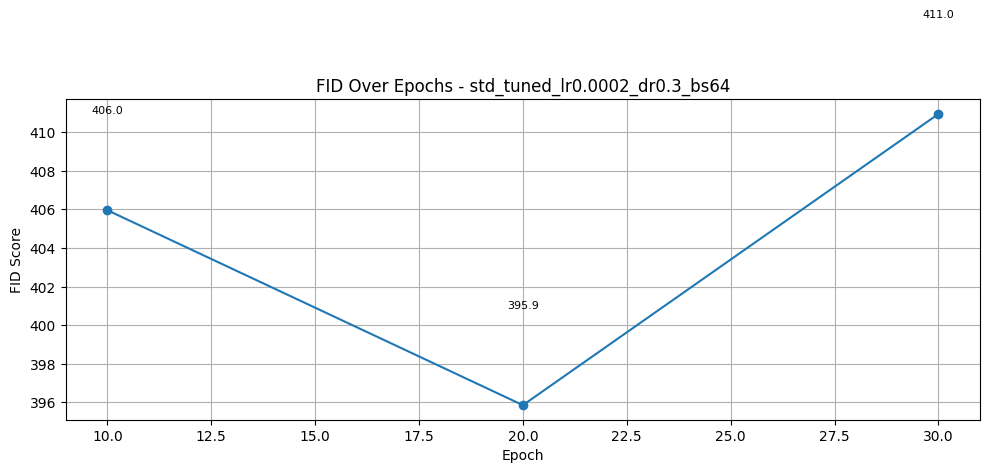

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Classifier Acc → Train: 50.38%, Test: 48.47%
FID (Standard, Test): 418.85
Standard GAN Combo: LR=0.0002, Dropout=0.3, Batch=128
Epoch 1 - G: 0.6329 | D: 0.8754
Epoch 2 - G: 1.1369 | D: 0.4023
Epoch 3 - G: 2.9211 | D: 0.0645
Epoch 4 - G: 4.2003 | D: 0.0219
Epoch 5 - G: 3.8842 | D: 0.0211
Epoch 6 - G: 4.3547 | D: 0.0137
Epoch 7 - G: 4.5120 | D: 0.0159
Epoch 8 - G: 3.4708 | D: 0.0341
Epoch 9 - G: 3.5175 | D: 0.0315
Epoch 10 - G: 4.5046 | D: 0.0115


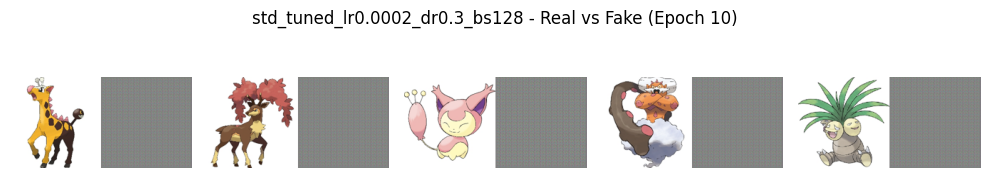

FID at Epoch 10: 409.51
Epoch 11 - G: 4.6170 | D: 0.0117
Epoch 12 - G: 3.9990 | D: 0.0199
Epoch 13 - G: 4.4068 | D: 0.0138
Epoch 14 - G: 4.4902 | D: 0.0116
Epoch 15 - G: 4.4414 | D: 0.0127
Epoch 16 - G: 3.9889 | D: 0.0221
Epoch 17 - G: 4.0932 | D: 0.0183
Epoch 18 - G: 2.4448 | D: 0.1015
Epoch 19 - G: 4.0634 | D: 0.1679
Epoch 20 - G: 6.7673 | D: 0.0018


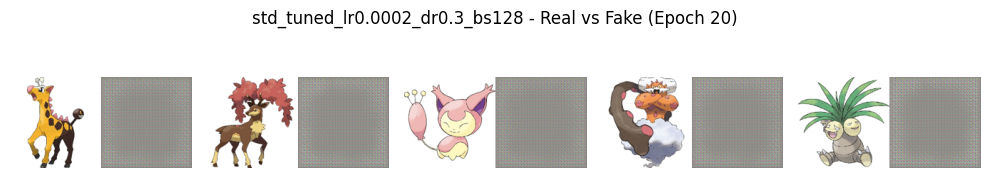

FID at Epoch 20: 403.70
Epoch 21 - G: 5.5020 | D: 0.2325
Epoch 22 - G: 4.0807 | D: 0.0192
Epoch 23 - G: 4.6820 | D: 0.0558
Epoch 24 - G: 1.7437 | D: 0.2100
Epoch 25 - G: 3.6824 | D: 0.0812
Epoch 26 - G: 3.7359 | D: 0.0506
Epoch 27 - G: 4.6399 | D: 0.0418
Epoch 28 - G: 3.9934 | D: 0.1609
Epoch 29 - G: 2.5701 | D: 0.1393
Epoch 30 - G: 2.9103 | D: 0.0609


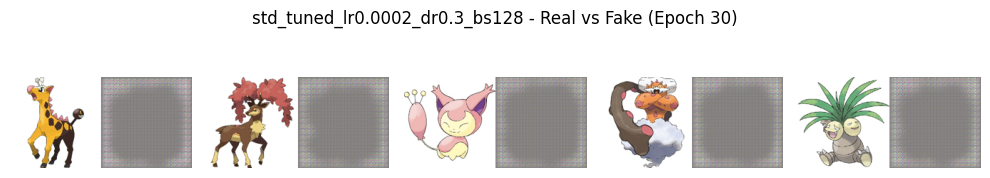

FID at Epoch 30: 508.14


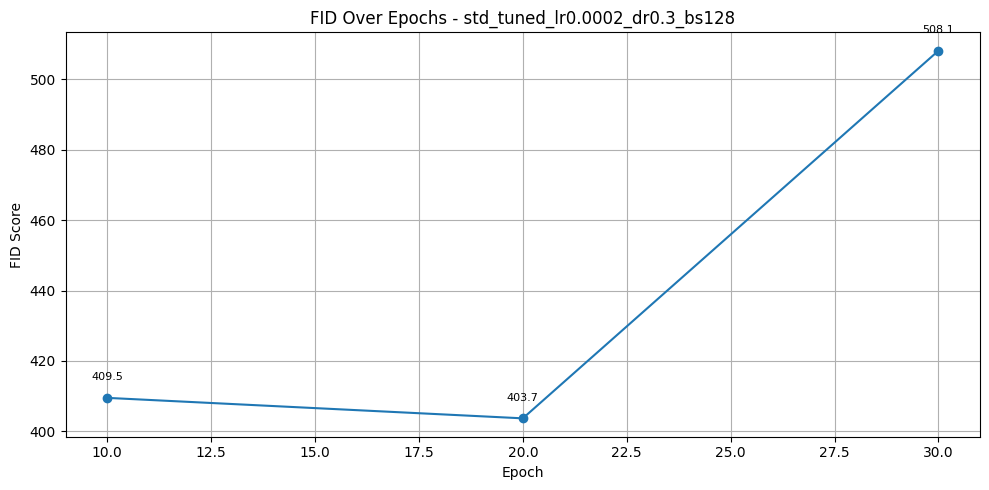

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Classifier Acc → Train: 49.62%, Test: 51.53%
FID (Standard, Test): 514.75

Best Standard DCGAN Params:
LR: 0.0001, Dropout: 0.2, Batch: 64
Best FID: 388.71


In [20]:
print("\nStarting Hyperparameter Tuning for Standard DCGAN...\n")

std_results = []

for lr, dropout, bsz in param_combos:
    print(f"Standard GAN Combo: LR={lr}, Dropout={dropout}, Batch={bsz}")
    BATCH_SIZE = bsz

    def tuned_std_generator():
        model = tf.keras.Sequential([
            layers.Dense(16 * 16 * 256, input_dim=LATENT_DIM),
            layers.Reshape((16, 16, 256)),                    # 16x16x256
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv2DTranspose(128, 4, strides=2, padding='same'),  # 32x32x128
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv2DTranspose(64, 4, strides=2, padding='same'),   # 64x64x64
            layers.BatchNormalization(),
            layers.ReLU(),
            layers.Conv2DTranspose(3, 4, strides=2, padding='same', activation='tanh')  # 128x128x3
        ])
        return model


    def tuned_std_discriminator():
        model = tf.keras.Sequential([
            layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3)),
            layers.Conv2D(64, 4, strides=2, padding="same"),   # 64x64x64
            layers.LeakyReLU(0.2),
            layers.Conv2D(128, 4, strides=2, padding="same"),  # 32x32x128
            layers.LeakyReLU(0.2),
            layers.Conv2D(256, 4, strides=2, padding="same"),  # 16x16x256
            layers.LeakyReLU(0.2),
            layers.Dropout(dropout),
            layers.Flatten(),                                 # 16*16*256 = 65536
            layers.Dense(1, activation='sigmoid')
        ])
        return model



    std_gen = tuned_std_generator()
    std_disc = tuned_std_discriminator()

    train_dcgan(std_gen, std_disc, train_images, f"std_tuned_lr{lr}_dr{dropout}_bs{bsz}")
    fake_path = os.path.join(SAVE_DIR, f"fid_std_tuned_lr{lr}_dr{dropout}_bs{bsz}")
    fid = calculate_fid(os.path.join(SAVE_DIR, "fid_real_test"), fake_path)
    # Evaluate real-vs-fake classifier on generated images
    Xtr_std, Xte_std, ytr_std, yte_std = load_classifier_data(std_gen, train_images)
    clf_std = build_classifier()
    clf_std.fit(Xtr_std, ytr_std, epochs=5, verbose=0)
    
    acc_train = smoothed_accuracy(ytr_std, clf_std.predict(Xtr_std).ravel())
    acc_test = smoothed_accuracy(yte_std, clf_std.predict(Xte_std).ravel())
    
    print(f"Classifier Acc → Train: {acc_train:.2%}, Test: {acc_test:.2%}")
    
    print(f"FID (Standard, Test): {fid:.2f}")
    if fid < best_fid_std:
        best_fid_std = fid
        best_combo_std = (lr, dropout, bsz)
        best_model_std = std_gen
    std_results.append((bsz, lr, dropout, fid, acc_test))

print("\nBest Standard DCGAN Params:")
print(f"LR: {best_combo_std[0]}, Dropout: {best_combo_std[1]}, Batch: {best_combo_std[2]}")
print(f"Best FID: {best_fid_std:.2f}")

# Restore original values
EPOCHS = original_epochs
BATCH_SIZE = original_batch_size

# Best Model Identification


Custom DCGAN - FID vs Batch Size

Standard DCGAN - FID vs Batch Size


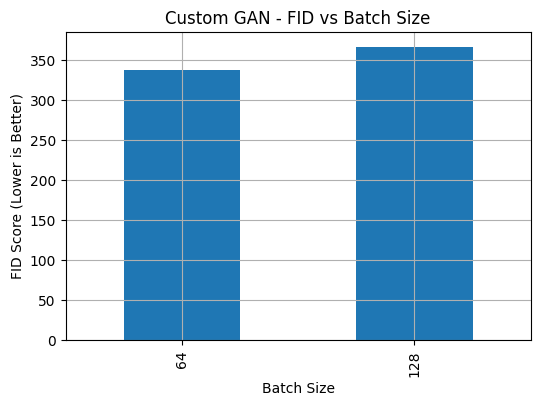

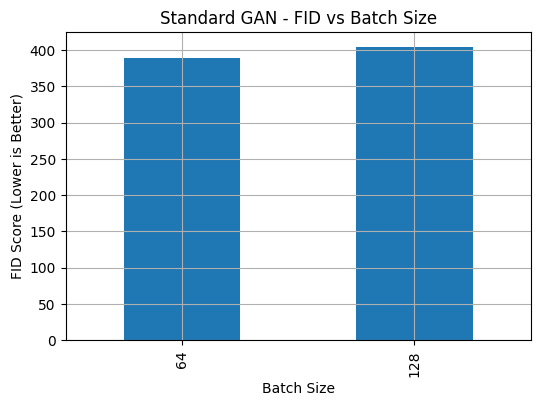

In [21]:
import pandas as pd
import matplotlib.pyplot as plt

# Create DataFrames
df_custom = pd.DataFrame(custom_results, columns=["Batch Size", "LR", "Dropout", "FID", "Acc"])
df_std = pd.DataFrame(std_results, columns=["Batch Size", "LR", "Dropout", "FID", "Acc"])

# Show summary table
print("\nCustom DCGAN - FID vs Batch Size")
df_custom.sort_values(["FID", "Acc"], ascending=[True, True])

print("\nStandard DCGAN - FID vs Batch Size")
df_std.sort_values(["FID", "Acc"], ascending=[True, True])

# Plot FID vs Batch Size for each model
def plot_fid_vs_batch(df, title):
    plt.figure(figsize=(6, 4))
    df.groupby("Batch Size")["FID"].min().plot(kind="bar")
    plt.title(title)
    plt.ylabel("FID Score (Lower is Better)")
    plt.xlabel("Batch Size")
    plt.grid(True)
    plt.show()

plot_fid_vs_batch(df_custom, "Custom GAN - FID vs Batch Size")
plot_fid_vs_batch(df_std, "Standard GAN - FID vs Batch Size")

# GAN Evaluation (FID on train + test) - After Hyperparameter Tuning

In [22]:
print("\nFinal Evaluation AFTER Hyperparameter Tuning\n")

# ---------------- Custom GAN ----------------
FAKE_CUS_TRAIN = os.path.join(SAVE_DIR, "fake_custom_best_train")
FAKE_CUS_TEST = os.path.join(SAVE_DIR, "fake_custom_best_test")
generate_fid_images(best_model_cus, FAKE_CUS_TRAIN)
generate_fid_images(best_model_cus, FAKE_CUS_TEST)

fid_cus_train = calculate_fid(os.path.join(SAVE_DIR, "fid_real_train"), FAKE_CUS_TRAIN)
fid_cus_test = calculate_fid(os.path.join(SAVE_DIR, "fid_real_test"), FAKE_CUS_TEST)

Xtr_cus, Xte_cus, ytr_cus, yte_cus = load_classifier_data(best_model_cus, train_images)
clf_cus = build_classifier()
clf_cus.fit(Xtr_cus, ytr_cus, epochs=5, verbose=0)
# acc_cus_train = clf_cus.evaluate(Xtr_cus, ytr_cus, verbose=0)[1]
# acc_cus_test = clf_cus.evaluate(Xte_cus, yte_cus, verbose=0)[1]
acc_cus_train = smoothed_accuracy(ytr_cus, clf_cus.predict(Xtr_cus).ravel())
acc_cus_test  = smoothed_accuracy(yte_cus, clf_cus.predict(Xte_cus).ravel())

# ---------------- Standard GAN ----------------
FAKE_STD_TRAIN = os.path.join(SAVE_DIR, "fake_standard_best_train")
FAKE_STD_TEST = os.path.join(SAVE_DIR, "fake_standard_best_test")
generate_fid_images(best_model_std, FAKE_STD_TRAIN)
generate_fid_images(best_model_std, FAKE_STD_TEST)

fid_std_train = calculate_fid(os.path.join(SAVE_DIR, "fid_real_train"), FAKE_STD_TRAIN)
fid_std_test = calculate_fid(os.path.join(SAVE_DIR, "fid_real_test"), FAKE_STD_TEST)

Xtr_std, Xte_std, ytr_std, yte_std = load_classifier_data(best_model_std, train_images)
clf_std = build_classifier()
clf_std.fit(Xtr_std, ytr_std, epochs=5, verbose=0)
# acc_std_train = clf_std.evaluate(Xtr_std, ytr_std, verbose=0)[1]
# acc_std_test = clf_std.evaluate(Xte_std, yte_std, verbose=0)[1]
acc_std_train = smoothed_accuracy(ytr_std, clf_std.predict(Xtr_std).ravel())
acc_std_test  = smoothed_accuracy(yte_std, clf_std.predict(Xte_std).ravel())

# ---------------- Summary Table ----------------
print("\nFinal Evaluation After Hyperparameter Tuning:")

print("\nBest Custom DCGAN")
print(f"FID (Train): {fid_cus_train:.2f} | FID (Test): {fid_cus_test:.2f}")
print(f"Classifier Acc (Train): {acc_cus_train:.2%} | (Test): {acc_cus_test:.2%}")

print("\nBest Standard DCGAN")
print(f"FID (Train): {fid_std_train:.2f} | FID (Test): {fid_std_test:.2f}")
print(f"Classifier Acc (Train): {acc_std_train:.2%} | (Test): {acc_std_test:.2%}")


Final Evaluation AFTER Hyperparameter Tuning

Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Final shape: X=(1310, 128, 128, 3), y=(1310,)
33/33 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step

Final Evaluation After Hyperparameter Tuning:

Best Custom DCGAN
FID (Train): 334.31 | FID (Test): 338.53
Classifier Acc (Train): 50.38% | (Test): 48.47%

Best Standard DCGAN
FID (Train): 357.94 | FID (Test): 363.46
Classifier Acc (Train): 95.52% | (Test): 95.42%
